# Mount Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: ignored

## Install ultralytics

In [ ]:
# Install ultralytics
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 659.4/659.4 kB 9.1 MB/s eta 0:00:00


# Install Super Gradients

In [ ]:
pip install super-gradients

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 70.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 59.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 104.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 120.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 46.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 22.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 104.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 74.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.0/68.0 kB 10.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements

In [ ]:
%matplotlib inline

from super_gradients.training import Trainer
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train,
    coco_detection_yolo_format_val
)
from super_gradients.training import models
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import (
    DetectionMetrics_050,
    DetectionMetrics_050_095
)
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback


import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import random
import os
import cv2
import shutil
import tqdm
import glob

[2023-12-07 09:45:14] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2023-12-07 09:45:14] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-12-07 09:45:14] INFO - utils.py - NumExpr defaulting to 8 threads.
[2023-12-07 09:45:22] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-12-07 09:45:22] WARNING - export.py - Failed to import pytorch_quantization
[2023-12-07 09:45:22] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-12-07 09:45:22] WARNING - env_sanity_check.py - Failed to verify installed packages: boto3 required but not found
[2023-12-07 09:45:22] WARNING - env_sanity_check.py - Failed to verify installed packages: deprecated required but not found
[2023-12-07 09:45:22] WARNING - env_sanity_check.py - Failed to verify installed packages: coverage required but not found
[2023-12-07 09:45:22] WARNING - env_sanity_check.py - Failed to verify installed packages: sphinx-rtd-theme required but not found
[2023-12-07 09:45:22] WARNING - env_sanity_check.py - Failed to verify i

In [ ]:
# Check GPU is working or not
import torch
print(f"Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

# Prepare Dataset

In [ ]:
os.mkdir('fashion_dataset')
os.mkdir('fashion_dataset/images')
os.mkdir('fashion_dataset/labels')

In [ ]:

os.mkdir('fashion_dataset/images/train')
os.mkdir('fashion_dataset/labels/train')

os.mkdir('fashion_dataset/images/val')
os.mkdir('fashion_dataset/labels/val')

os.mkdir('fashion_dataset/images/test')
os.mkdir('fashion_dataset/labels/test')


In [ ]:
ROOT_DIR = 'drive/MyDrive/colorful_fashion_dataset_for_object_detection/'
images_path = 'JPEGImages/'
annotations_path = 'Annotations_txt/'
all_images=os.listdir(os.path.join(ROOT_DIR,images_path))

train_images, rest_images = train_test_split(all_images, test_size=0.3, random_state=42)
val_images, test_images = train_test_split(rest_images, test_size=0.5, random_state=42)

train_imgs_dir = 'fashion_dataset/images/train/'
train_labels_dir = 'fashion_dataset/labels/train/'
val_imgs_dir = 'fashion_dataset/images/val/'
val_labels_dir = 'fashion_dataset/labels/val/'
test_imgs_dir = 'fashion_dataset/images/test/'
test_labels_dir = 'fashion_dataset/labels/test/'


print('Copying Train Data..!!')
for i in tqdm.tqdm(train_images):
  i=i.replace('.jpg','')
  a = shutil.copyfile(os.path.join(ROOT_DIR,images_path)+i+'.jpg', train_imgs_dir+i+'.jpg')
  a = shutil.copyfile(os.path.join(ROOT_DIR,annotations_path)+i+'.txt', train_labels_dir+i+'.txt')

print('Copying Val Data..!!')
for i in tqdm.tqdm(val_images):
  i=i.replace('.jpg','')
  a = shutil.copyfile(os.path.join(ROOT_DIR,images_path)+i+'.jpg', val_imgs_dir+i+'.jpg')
  a = shutil.copyfile(os.path.join(ROOT_DIR,annotations_path)+i+'.txt', val_labels_dir+i+'.txt')

print('Copying Test Data..!!')
for i in tqdm.tqdm(test_images):
  i=i.replace('.jpg','')
  a = shutil.copyfile(os.path.join(ROOT_DIR,images_path)+i+'.jpg', test_imgs_dir+i+'.jpg')
  a = shutil.copyfile(os.path.join(ROOT_DIR,annotations_path)+i+'.txt', test_labels_dir+i+'.txt')

Using torch 2.1.0+cu118 (Tesla T4)
Copying Train Data..!!


  0%|          | 0/402 [00:00<?, ?it/s]

Copying Val Data..!!


  0%|          | 0/403 [00:00<?, ?it/s]

Copying Test Data..!!


100%|█████████▉| 402/403 [04:24<00:00,  1.61it/s]

In [ ]:
classes = ['sunglass','hat','jacket','shirt','pants','shorts','skirt','dress','bag','shoe']
ROOT_DIR='fashion_dataset/'
train_imgs_dir = 'images/train/'
train_labels_dir = 'labels/train/'
val_imgs_dir = 'images/val/'
val_labels_dir = 'labels/val/'
test_imgs_dir = 'images/test/'
test_labels_dir = 'labels/test/'
dataset_params = {
    'data_dir':ROOT_DIR,
    'train_images_dir':train_imgs_dir,
    'train_labels_dir':train_labels_dir,
    'val_images_dir':val_imgs_dir,
    'val_labels_dir':val_labels_dir,
    'test_images_dir':test_imgs_dir,
    'test_labels_dir':test_labels_dir,
    'classes':classes
}

# Define Hyperparameters

In [ ]:
epochs=25
batch_size=16
workers=8

# Create Dataloaders

In [ ]:
dataset_params['train_images_dir']

'images/train/'

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':batch_size,
        'num_workers':workers
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':batch_size,
        'num_workers':workers
    }
)

100%|██████████| 403/403 [04:25<00:00,  1.52it/s]
[2023-12-07 10:15:57] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 1877/1877 [00:00<00:00, 6380.80it/s]
[2023-12-07 10:15:57] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.


# Data Augmentation

In [ ]:
train_data.dataset.transforms

[DetectionMosaic('additional_samples_count': 3, 'non_empty_targets': False, 'prob': 1.0, 'input_dim': (640, 640), 'enable_mosaic': True, 'border_value': 114),
 DetectionRandomAffine('additional_samples_count': 0, 'non_empty_targets': False, 'degrees': 10.0, 'translate': 0.1, 'scale': [0.1, 2], 'shear': 2.0, 'target_size': (640, 640), 'enable': True, 'filter_box_candidates': True, 'wh_thr': 2, 'ar_thr': 20, 'area_thr': 0.1, 'border_value': 114),
 DetectionMixup('additional_samples_count': 1, 'non_empty_targets': True, 'input_dim': (640, 640), 'mixup_scale': [0.5, 1.5], 'prob': 1.0, 'enable_mixup': True, 'flip_prob': 0.5, 'border_value': 114),
 DetectionHSV('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 1.0, 'hgain': 5, 'sgain': 30, 'vgain': 30, 'bgr_channels': (0, 1, 2), '_additional_channels_warned': False),
 DetectionHorizontalFlip('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 0.5),
 DetectionPaddedRescale('additional_samples_count': 0, 'non_em

In [ ]:
train_data.dataset.transforms.pop(2)

DetectionMixup('additional_samples_count': 1, 'non_empty_targets': True, 'input_dim': (640, 640), 'mixup_scale': [0.5, 1.5], 'prob': 1.0, 'enable_mixup': True, 'flip_prob': 0.5, 'border_value': 114)

Indexing dataset annotations: 100%|██████████| 402/402 [00:00<00:00, 6386.01it/s]


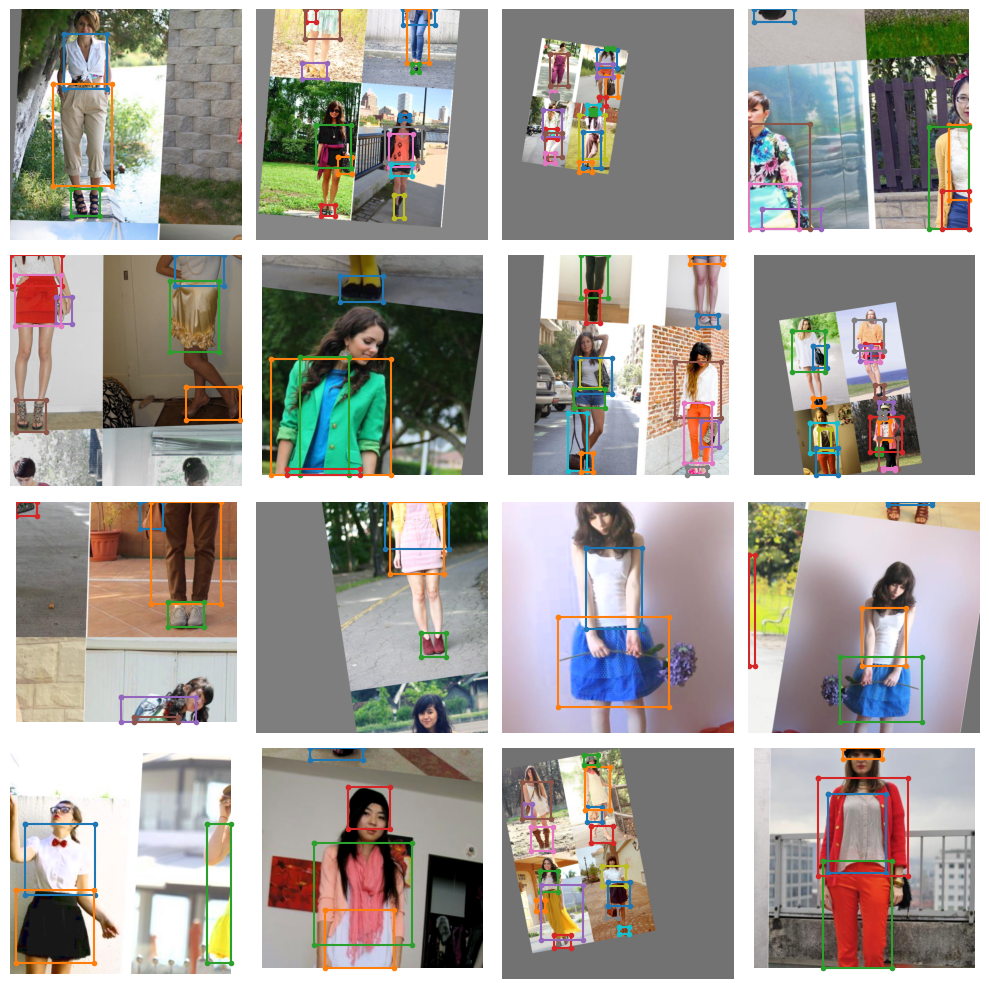

In [ ]:
train_data.dataset.plot(plot_transformed_data=True)

# Define training params

In [ ]:
train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": epochs,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        ),
        DetectionMetrics_050_095(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50:0.95'
}

# Train model

In [ ]:
models_to_train = [
    'yolo_nas_s',
    'yolo_nas_m',
    'yolo_nas_l'
]

CHECKPOINT_DIR = 'checkpoints_1'

for model_to_train in models_to_train:
    trainer = Trainer(
        experiment_name=model_to_train,
        ckpt_root_dir=CHECKPOINT_DIR
    )

    model = models.get(
        model_to_train,
        num_classes=len(dataset_params['classes']),
        pretrained_weights="coco"
    )

    trainer.train(

        model=model,
        training_params=train_params,
        train_loader=train_data,
        valid_loader=val_data
    )

[2023-12-07 12:07:46] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-12-07 12:07:46] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_s
[2023-12-07 12:07:46] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20231207_120746_886591`
[2023-12-07 12:07:46] INFO - sg_trainer.py - Checkpoints directory: checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591
[2023-12-07 12:07:46] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}


The console stream is now moved to checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/console_Dec07_12_07_46.txt


/usr/local/lib/python3.10/dist-packages/super_gradients/common/registry/registry.py:72: DeprecationWarning: Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
  warnings.warn(f"Object name `{name}` is now deprecated. Please replace it with `{deprecated_names[name]}`.", DeprecationWarning)
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/optimizer_utils.py:107: DeprecationWarning: initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr values through initial_lr training hyperparameter (i.e initial_lr={'backbone': 0.01, 'default':0.1})
  warnings.warn(
[2023-12-07 12:07:50] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.3567
│   ├── Ppyoloeloss/loss_iou = 0.6506
│   ├── Ppyoloeloss/loss_dfl = 0.7379
│   └── Ppyoloeloss/loss = 3.7452
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.4069
    ├── Ppyoloeloss/loss_iou = 0.5728
    ├── Ppyoloeloss/loss_dfl = 0.7102
    ├── Ppyoloeloss/loss = 3.69
    ├── Precision@0.50 = 0.0136
    ├── Recall@0.50 = 0.0074
    ├── Map@0.50 = 0.0051
    ├── F1@0.50 = 0.0095
    ├── Precision@0.50:0.95 = 0.0064
    ├── Recall@0.50:0.95 = 0.0033
    ├── Map@0.50:0.95 = 0.0017
    └── F1@0.50:0.95 = 0.0043



Validating epoch 1: 100%|██████████| 26/26 [00:13<00:00,  1.98it/s]
[2023-12-07 12:10:23] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:10:23] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.26316893100738525


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2554
│   │   ├── Epoch N-1      = 2.3567 (↘ -1.1013)
│   │   └── Best until now = 2.3567 (↘ -1.1013)
│   ├── Ppyoloeloss/loss_iou = 0.5101
│   │   ├── Epoch N-1      = 0.6506 (↘ -0.1405)
│   │   └── Best until now = 0.6506 (↘ -0.1405)
│   ├── Ppyoloeloss/loss_dfl = 0.5732
│   │   ├── Epoch N-1      = 0.7379 (↘ -0.1647)
│   │   └── Best until now = 0.7379 (↘ -0.1647)
│   └── Ppyoloeloss/loss = 2.3387
│       ├── Epoch N-1      = 3.7452 (↘ -1.4065)
│       └── Best until now = 3.7452 (↘ -1.4065)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0636
    │   ├── Epoch N-1      = 2.4069 (↘ -1.3434)
    │   └── Best until now = 2.4069 (↘ -1.3434)
    ├── Ppyoloeloss/loss_iou = 0.5244
    │   ├── Epoch N-1      = 0.5728 (↘ -0.0484)
    │   └── Best until now = 0.5728 (↘ -0.0484)
    ├── Ppyoloeloss/loss_dfl = 0.6074
    │   ├── Epoch N-1      = 0.7102 (↘ -0.1028)
    │   └── Best until now = 0.7102 (↘ -0.1028)
    ├── Ppyoloeloss/lo

Validating epoch 2: 100%|██████████| 26/26 [00:12<00:00,  2.00it/s]
[2023-12-07 12:11:42] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:11:42] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.3145561218261719


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0663
│   │   ├── Epoch N-1      = 1.2554 (↘ -0.1891)
│   │   └── Best until now = 1.2554 (↘ -0.1891)
│   ├── Ppyoloeloss/loss_iou = 0.4991
│   │   ├── Epoch N-1      = 0.5101 (↘ -0.0111)
│   │   └── Best until now = 0.5101 (↘ -0.0111)
│   ├── Ppyoloeloss/loss_dfl = 0.5578
│   │   ├── Epoch N-1      = 0.5732 (↘ -0.0153)
│   │   └── Best until now = 0.5732 (↘ -0.0153)
│   └── Ppyoloeloss/loss = 2.1232
│       ├── Epoch N-1      = 2.3387 (↘ -0.2155)
│       └── Best until now = 2.3387 (↘ -0.2155)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9881
    │   ├── Epoch N-1      = 1.0636 (↘ -0.0755)
    │   └── Best until now = 1.0636 (↘ -0.0755)
    ├── Ppyoloeloss/loss_iou = 0.5216
    │   ├── Epoch N-1      = 0.5244 (↘ -0.0027)
    │   └── Best until now = 0.5244 (↘ -0.0027)
    ├── Ppyoloeloss/loss_dfl = 0.5957
    │   ├── Epoch N-1      = 0.6074 (↘ -0.0117)
    │   └── Best until now = 0.6074 (↘ -0.0117)
    ├── Ppyoloeloss/lo

Validating epoch 3: 100%|██████████| 26/26 [00:13<00:00,  1.98it/s]
[2023-12-07 12:13:01] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:13:01] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.31606805324554443


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.036
│   │   ├── Epoch N-1      = 1.0663 (↘ -0.0303)
│   │   └── Best until now = 1.0663 (↘ -0.0303)
│   ├── Ppyoloeloss/loss_iou = 0.5017
│   │   ├── Epoch N-1      = 0.4991 (↗ 0.0026)
│   │   └── Best until now = 0.4991 (↗ 0.0026)
│   ├── Ppyoloeloss/loss_dfl = 0.561
│   │   ├── Epoch N-1      = 0.5578 (↗ 0.0032)
│   │   └── Best until now = 0.5578 (↗ 0.0032)
│   └── Ppyoloeloss/loss = 2.0987
│       ├── Epoch N-1      = 2.1232 (↘ -0.0245)
│       └── Best until now = 2.1232 (↘ -0.0245)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9627
    │   ├── Epoch N-1      = 0.9881 (↘ -0.0253)
    │   └── Best until now = 0.9881 (↘ -0.0253)
    ├── Ppyoloeloss/loss_iou = 0.5683
    │   ├── Epoch N-1      = 0.5216 (↗ 0.0467)
    │   └── Best until now = 0.5216 (↗ 0.0467)
    ├── Ppyoloeloss/loss_dfl = 0.6167
    │   ├── Epoch N-1      = 0.5957 (↗ 0.021)
    │   └── Best until now = 0.5957 (↗ 0.021)
    ├── Ppyoloeloss/loss = 2.1478


Validating epoch 4: 100%|██████████| 26/26 [00:12<00:00,  2.02it/s]
[2023-12-07 12:14:23] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:14:23] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.3533403277397156


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.985
│   │   ├── Epoch N-1      = 1.036  (↘ -0.051)
│   │   └── Best until now = 1.036  (↘ -0.051)
│   ├── Ppyoloeloss/loss_iou = 0.4892
│   │   ├── Epoch N-1      = 0.5017 (↘ -0.0124)
│   │   └── Best until now = 0.4991 (↘ -0.0098)
│   ├── Ppyoloeloss/loss_dfl = 0.5443
│   │   ├── Epoch N-1      = 0.561  (↘ -0.0167)
│   │   └── Best until now = 0.5578 (↘ -0.0135)
│   └── Ppyoloeloss/loss = 2.0186
│       ├── Epoch N-1      = 2.0987 (↘ -0.0802)
│       └── Best until now = 2.0987 (↘ -0.0802)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9201
    │   ├── Epoch N-1      = 0.9627 (↘ -0.0427)
    │   └── Best until now = 0.9627 (↘ -0.0427)
    ├── Ppyoloeloss/loss_iou = 0.5263
    │   ├── Epoch N-1      = 0.5683 (↘ -0.0421)
    │   └── Best until now = 0.5216 (↗ 0.0047)
    ├── Ppyoloeloss/loss_dfl = 0.593
    │   ├── Epoch N-1      = 0.6167 (↘ -0.0237)
    │   └── Best until now = 0.5957 (↘ -0.0027)
    ├── Ppyoloeloss/loss = 

Validating epoch 5: 100%|██████████| 26/26 [00:12<00:00,  2.01it/s]
[2023-12-07 12:15:42] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:15:42] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.35875576734542847


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9605
│   │   ├── Epoch N-1      = 0.985  (↘ -0.0245)
│   │   └── Best until now = 0.985  (↘ -0.0245)
│   ├── Ppyoloeloss/loss_iou = 0.4812
│   │   ├── Epoch N-1      = 0.4892 (↘ -0.0081)
│   │   └── Best until now = 0.4892 (↘ -0.0081)
│   ├── Ppyoloeloss/loss_dfl = 0.5397
│   │   ├── Epoch N-1      = 0.5443 (↘ -0.0047)
│   │   └── Best until now = 0.5443 (↘ -0.0047)
│   └── Ppyoloeloss/loss = 1.9813
│       ├── Epoch N-1      = 2.0186 (↘ -0.0372)
│       └── Best until now = 2.0186 (↘ -0.0372)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9153
    │   ├── Epoch N-1      = 0.9201 (↘ -0.0048)
    │   └── Best until now = 0.9201 (↘ -0.0048)
    ├── Ppyoloeloss/loss_iou = 0.5167
    │   ├── Epoch N-1      = 0.5263 (↘ -0.0096)
    │   └── Best until now = 0.5216 (↘ -0.005)
    ├── Ppyoloeloss/loss_dfl = 0.5814
    │   ├── Epoch N-1      = 0.593  (↘ -0.0116)
    │   └── Best until now = 0.593  (↘ -0.0116)
    ├── Ppyoloeloss/los

Validating epoch 6: 100%|██████████| 26/26 [00:12<00:00,  2.04it/s]
[2023-12-07 12:17:03] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:17:03] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.37489068508148193


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9431
│   │   ├── Epoch N-1      = 0.9605 (↘ -0.0173)
│   │   └── Best until now = 0.9605 (↘ -0.0173)
│   ├── Ppyoloeloss/loss_iou = 0.4746
│   │   ├── Epoch N-1      = 0.4812 (↘ -0.0065)
│   │   └── Best until now = 0.4812 (↘ -0.0065)
│   ├── Ppyoloeloss/loss_dfl = 0.5283
│   │   ├── Epoch N-1      = 0.5397 (↘ -0.0113)
│   │   └── Best until now = 0.5397 (↘ -0.0113)
│   └── Ppyoloeloss/loss = 1.9461
│       ├── Epoch N-1      = 1.9813 (↘ -0.0352)
│       └── Best until now = 1.9813 (↘ -0.0352)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8927
    │   ├── Epoch N-1      = 0.9153 (↘ -0.0226)
    │   └── Best until now = 0.9153 (↘ -0.0226)
    ├── Ppyoloeloss/loss_iou = 0.5441
    │   ├── Epoch N-1      = 0.5167 (↗ 0.0274)
    │   └── Best until now = 0.5167 (↗ 0.0274)
    ├── Ppyoloeloss/loss_dfl = 0.5841
    │   ├── Epoch N-1      = 0.5814 (↗ 0.0027)
    │   └── Best until now = 0.5814 (↗ 0.0027)
    ├── Ppyoloeloss/loss =

Validating epoch 7: 100%|██████████| 26/26 [00:13<00:00,  1.99it/s]
[2023-12-07 12:18:24] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:18:24] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.41068583726882935


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9288
│   │   ├── Epoch N-1      = 0.9431 (↘ -0.0143)
│   │   └── Best until now = 0.9431 (↘ -0.0143)
│   ├── Ppyoloeloss/loss_iou = 0.4725
│   │   ├── Epoch N-1      = 0.4746 (↘ -0.0022)
│   │   └── Best until now = 0.4746 (↘ -0.0022)
│   ├── Ppyoloeloss/loss_dfl = 0.5243
│   │   ├── Epoch N-1      = 0.5283 (↘ -0.0041)
│   │   └── Best until now = 0.5283 (↘ -0.0041)
│   └── Ppyoloeloss/loss = 1.9256
│       ├── Epoch N-1      = 1.9461 (↘ -0.0206)
│       └── Best until now = 1.9461 (↘ -0.0206)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8841
    │   ├── Epoch N-1      = 0.8927 (↘ -0.0085)
    │   └── Best until now = 0.8927 (↘ -0.0085)
    ├── Ppyoloeloss/loss_iou = 0.4824
    │   ├── Epoch N-1      = 0.5441 (↘ -0.0616)
    │   └── Best until now = 0.5167 (↘ -0.0342)
    ├── Ppyoloeloss/loss_dfl = 0.5412
    │   ├── Epoch N-1      = 0.5841 (↘ -0.0429)
    │   └── Best until now = 0.5814 (↘ -0.0402)
    ├── Ppyoloeloss/lo

Validating epoch 8: 100%|██████████| 26/26 [00:13<00:00,  1.97it/s]


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9197
│   │   ├── Epoch N-1      = 0.9288 (↘ -0.0091)
│   │   └── Best until now = 0.9288 (↘ -0.0091)
│   ├── Ppyoloeloss/loss_iou = 0.4641
│   │   ├── Epoch N-1      = 0.4725 (↘ -0.0084)
│   │   └── Best until now = 0.4725 (↘ -0.0084)
│   ├── Ppyoloeloss/loss_dfl = 0.5256
│   │   ├── Epoch N-1      = 0.5243 (↗ 0.0013)
│   │   └── Best until now = 0.5243 (↗ 0.0013)
│   └── Ppyoloeloss/loss = 1.9094
│       ├── Epoch N-1      = 1.9256 (↘ -0.0161)
│       └── Best until now = 1.9256 (↘ -0.0161)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8607
    │   ├── Epoch N-1      = 0.8841 (↘ -0.0234)
    │   └── Best until now = 0.8841 (↘ -0.0234)
    ├── Ppyoloeloss/loss_iou = 0.5149
    │   ├── Epoch N-1      = 0.4824 (↗ 0.0324)
    │   └── Best until now = 0.4824 (↗ 0.0324)
    ├── Ppyoloeloss/loss_dfl = 0.5741
    │   ├── Epoch N-1      = 0.5412 (↗ 0.0329)
    │   └── Best until now = 0.5412 (↗ 0.0329)
    ├── Ppyoloeloss/loss = 1

Validating epoch 9: 100%|██████████| 26/26 [00:13<00:00,  1.99it/s]


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9126
│   │   ├── Epoch N-1      = 0.9197 (↘ -0.0071)
│   │   └── Best until now = 0.9197 (↘ -0.0071)
│   ├── Ppyoloeloss/loss_iou = 0.4632
│   │   ├── Epoch N-1      = 0.4641 (↘ -0.0009)
│   │   └── Best until now = 0.4641 (↘ -0.0009)
│   ├── Ppyoloeloss/loss_dfl = 0.5232
│   │   ├── Epoch N-1      = 0.5256 (↘ -0.0024)
│   │   └── Best until now = 0.5243 (↘ -0.001)
│   └── Ppyoloeloss/loss = 1.899
│       ├── Epoch N-1      = 1.9094 (↘ -0.0104)
│       └── Best until now = 1.9094 (↘ -0.0104)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.868
    │   ├── Epoch N-1      = 0.8607 (↗ 0.0073)
    │   └── Best until now = 0.8607 (↗ 0.0073)
    ├── Ppyoloeloss/loss_iou = 0.5269
    │   ├── Epoch N-1      = 0.5149 (↗ 0.012)
    │   └── Best until now = 0.4824 (↗ 0.0444)
    ├── Ppyoloeloss/loss_dfl = 0.5701
    │   ├── Epoch N-1      = 0.5741 (↘ -0.004)
    │   └── Best until now = 0.5412 (↗ 0.0289)
    ├── Ppyoloeloss/loss = 1.965

Validating epoch 10: 100%|██████████| 26/26 [00:13<00:00,  1.96it/s]
[2023-12-07 12:22:28] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:22:28] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.43826836347579956


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8937
│   │   ├── Epoch N-1      = 0.9126 (↘ -0.0189)
│   │   └── Best until now = 0.9126 (↘ -0.0189)
│   ├── Ppyoloeloss/loss_iou = 0.462
│   │   ├── Epoch N-1      = 0.4632 (↘ -0.0012)
│   │   └── Best until now = 0.4632 (↘ -0.0012)
│   ├── Ppyoloeloss/loss_dfl = 0.5202
│   │   ├── Epoch N-1      = 0.5232 (↘ -0.0031)
│   │   └── Best until now = 0.5232 (↘ -0.0031)
│   └── Ppyoloeloss/loss = 1.8759
│       ├── Epoch N-1      = 1.899  (↘ -0.0231)
│       └── Best until now = 1.899  (↘ -0.0231)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8351
    │   ├── Epoch N-1      = 0.868  (↘ -0.033)
    │   └── Best until now = 0.8607 (↘ -0.0256)
    ├── Ppyoloeloss/loss_iou = 0.4694
    │   ├── Epoch N-1      = 0.5269 (↘ -0.0574)
    │   └── Best until now = 0.4824 (↘ -0.013)
    ├── Ppyoloeloss/loss_dfl = 0.5332
    │   ├── Epoch N-1      = 0.5701 (↘ -0.0369)
    │   └── Best until now = 0.5412 (↘ -0.008)
    ├── Ppyoloeloss/loss 

Validating epoch 11: 100%|██████████| 26/26 [00:13<00:00,  1.98it/s]


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8754
│   │   ├── Epoch N-1      = 0.8937 (↘ -0.0183)
│   │   └── Best until now = 0.8937 (↘ -0.0183)
│   ├── Ppyoloeloss/loss_iou = 0.4526
│   │   ├── Epoch N-1      = 0.462  (↘ -0.0094)
│   │   └── Best until now = 0.462  (↘ -0.0094)
│   ├── Ppyoloeloss/loss_dfl = 0.5103
│   │   ├── Epoch N-1      = 0.5202 (↘ -0.0098)
│   │   └── Best until now = 0.5202 (↘ -0.0098)
│   └── Ppyoloeloss/loss = 1.8384
│       ├── Epoch N-1      = 1.8759 (↘ -0.0375)
│       └── Best until now = 1.8759 (↘ -0.0375)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8427
    │   ├── Epoch N-1      = 0.8351 (↗ 0.0076)
    │   └── Best until now = 0.8351 (↗ 0.0076)
    ├── Ppyoloeloss/loss_iou = 0.5239
    │   ├── Epoch N-1      = 0.4694 (↗ 0.0544)
    │   └── Best until now = 0.4694 (↗ 0.0544)
    ├── Ppyoloeloss/loss_dfl = 0.5722
    │   ├── Epoch N-1      = 0.5332 (↗ 0.039)
    │   └── Best until now = 0.5332 (↗ 0.039)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 12: 100%|██████████| 26/26 [00:12<00:00,  2.04it/s]
[2023-12-07 12:25:11] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:25:11] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.44906482100486755


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8737
│   │   ├── Epoch N-1      = 0.8754 (↘ -0.0017)
│   │   └── Best until now = 0.8754 (↘ -0.0017)
│   ├── Ppyoloeloss/loss_iou = 0.4541
│   │   ├── Epoch N-1      = 0.4526 (↗ 0.0015)
│   │   └── Best until now = 0.4526 (↗ 0.0015)
│   ├── Ppyoloeloss/loss_dfl = 0.5116
│   │   ├── Epoch N-1      = 0.5103 (↗ 0.0013)
│   │   └── Best until now = 0.5103 (↗ 0.0013)
│   └── Ppyoloeloss/loss = 1.8394
│       ├── Epoch N-1      = 1.8384 (↗ 0.001)
│       └── Best until now = 1.8384 (↗ 0.001)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8172
    │   ├── Epoch N-1      = 0.8427 (↘ -0.0255)
    │   └── Best until now = 0.8351 (↘ -0.0179)
    ├── Ppyoloeloss/loss_iou = 0.4762
    │   ├── Epoch N-1      = 0.5239 (↘ -0.0477)
    │   └── Best until now = 0.4694 (↗ 0.0067)
    ├── Ppyoloeloss/loss_dfl = 0.539
    │   ├── Epoch N-1      = 0.5722 (↘ -0.0332)
    │   └── Best until now = 0.5332 (↗ 0.0059)
    ├── Ppyoloeloss/loss = 1.832

Validating epoch 13: 100%|██████████| 26/26 [00:13<00:00,  2.00it/s]
[2023-12-07 12:26:33] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:26:33] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.46186843514442444


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8719
│   │   ├── Epoch N-1      = 0.8737 (↘ -0.0018)
│   │   └── Best until now = 0.8737 (↘ -0.0018)
│   ├── Ppyoloeloss/loss_iou = 0.4454
│   │   ├── Epoch N-1      = 0.4541 (↘ -0.0087)
│   │   └── Best until now = 0.4526 (↘ -0.0073)
│   ├── Ppyoloeloss/loss_dfl = 0.5091
│   │   ├── Epoch N-1      = 0.5116 (↘ -0.0025)
│   │   └── Best until now = 0.5103 (↘ -0.0012)
│   └── Ppyoloeloss/loss = 1.8264
│       ├── Epoch N-1      = 1.8394 (↘ -0.013)
│       └── Best until now = 1.8384 (↘ -0.012)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8116
    │   ├── Epoch N-1      = 0.8172 (↘ -0.0057)
    │   └── Best until now = 0.8172 (↘ -0.0057)
    ├── Ppyoloeloss/loss_iou = 0.4763
    │   ├── Epoch N-1      = 0.4762 (↗ 1e-04)
    │   └── Best until now = 0.4694 (↗ 0.0068)
    ├── Ppyoloeloss/loss_dfl = 0.5374
    │   ├── Epoch N-1      = 0.539  (↘ -0.0016)
    │   └── Best until now = 0.5332 (↗ 0.0042)
    ├── Ppyoloeloss/loss = 

Validating epoch 14: 100%|██████████| 26/26 [00:13<00:00,  1.97it/s]


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8647
│   │   ├── Epoch N-1      = 0.8719 (↘ -0.0071)
│   │   └── Best until now = 0.8719 (↘ -0.0071)
│   ├── Ppyoloeloss/loss_iou = 0.444
│   │   ├── Epoch N-1      = 0.4454 (↘ -0.0013)
│   │   └── Best until now = 0.4454 (↘ -0.0013)
│   ├── Ppyoloeloss/loss_dfl = 0.5077
│   │   ├── Epoch N-1      = 0.5091 (↘ -0.0014)
│   │   └── Best until now = 0.5091 (↘ -0.0014)
│   └── Ppyoloeloss/loss = 1.8165
│       ├── Epoch N-1      = 1.8264 (↘ -0.0099)
│       └── Best until now = 1.8264 (↘ -0.0099)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8241
    │   ├── Epoch N-1      = 0.8116 (↗ 0.0125)
    │   └── Best until now = 0.8116 (↗ 0.0125)
    ├── Ppyoloeloss/loss_iou = 0.4668
    │   ├── Epoch N-1      = 0.4763 (↘ -0.0095)
    │   └── Best until now = 0.4694 (↘ -0.0027)
    ├── Ppyoloeloss/loss_dfl = 0.5307
    │   ├── Epoch N-1      = 0.5374 (↘ -0.0067)
    │   └── Best until now = 0.5332 (↘ -0.0025)
    ├── Ppyoloeloss/loss

Validating epoch 15: 100%|██████████| 26/26 [00:12<00:00,  2.02it/s]


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8564
│   │   ├── Epoch N-1      = 0.8647 (↘ -0.0084)
│   │   └── Best until now = 0.8647 (↘ -0.0084)
│   ├── Ppyoloeloss/loss_iou = 0.4387
│   │   ├── Epoch N-1      = 0.444  (↘ -0.0054)
│   │   └── Best until now = 0.444  (↘ -0.0054)
│   ├── Ppyoloeloss/loss_dfl = 0.5
│   │   ├── Epoch N-1      = 0.5077 (↘ -0.0077)
│   │   └── Best until now = 0.5077 (↘ -0.0077)
│   └── Ppyoloeloss/loss = 1.7951
│       ├── Epoch N-1      = 1.8165 (↘ -0.0214)
│       └── Best until now = 1.8165 (↘ -0.0214)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8269
    │   ├── Epoch N-1      = 0.8241 (↗ 0.0028)
    │   └── Best until now = 0.8116 (↗ 0.0154)
    ├── Ppyoloeloss/loss_iou = 0.4968
    │   ├── Epoch N-1      = 0.4668 (↗ 0.03)
    │   └── Best until now = 0.4668 (↗ 0.03)
    ├── Ppyoloeloss/loss_dfl = 0.5434
    │   ├── Epoch N-1      = 0.5307 (↗ 0.0127)
    │   └── Best until now = 0.5307 (↗ 0.0127)
    ├── Ppyoloeloss/loss = 1.8671


Validating epoch 16: 100%|██████████| 26/26 [00:13<00:00,  1.99it/s]


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8414
│   │   ├── Epoch N-1      = 0.8564 (↘ -0.015)
│   │   └── Best until now = 0.8564 (↘ -0.015)
│   ├── Ppyoloeloss/loss_iou = 0.4346
│   │   ├── Epoch N-1      = 0.4387 (↘ -0.0041)
│   │   └── Best until now = 0.4387 (↘ -0.0041)
│   ├── Ppyoloeloss/loss_dfl = 0.4957
│   │   ├── Epoch N-1      = 0.5    (↘ -0.0043)
│   │   └── Best until now = 0.5    (↘ -0.0043)
│   └── Ppyoloeloss/loss = 1.7717
│       ├── Epoch N-1      = 1.7951 (↘ -0.0234)
│       └── Best until now = 1.7951 (↘ -0.0234)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8058
    │   ├── Epoch N-1      = 0.8269 (↘ -0.0211)
    │   └── Best until now = 0.8116 (↘ -0.0058)
    ├── Ppyoloeloss/loss_iou = 0.4905
    │   ├── Epoch N-1      = 0.4968 (↘ -0.0062)
    │   └── Best until now = 0.4668 (↗ 0.0237)
    ├── Ppyoloeloss/loss_dfl = 0.5456
    │   ├── Epoch N-1      = 0.5434 (↗ 0.0022)
    │   └── Best until now = 0.5307 (↗ 0.0149)
    ├── Ppyoloeloss/loss =

Validating epoch 17: 100%|██████████| 26/26 [00:13<00:00,  1.98it/s]


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8268
│   │   ├── Epoch N-1      = 0.8414 (↘ -0.0146)
│   │   └── Best until now = 0.8414 (↘ -0.0146)
│   ├── Ppyoloeloss/loss_iou = 0.4263
│   │   ├── Epoch N-1      = 0.4346 (↘ -0.0083)
│   │   └── Best until now = 0.4346 (↘ -0.0083)
│   ├── Ppyoloeloss/loss_dfl = 0.4876
│   │   ├── Epoch N-1      = 0.4957 (↘ -0.0081)
│   │   └── Best until now = 0.4957 (↘ -0.0081)
│   └── Ppyoloeloss/loss = 1.7407
│       ├── Epoch N-1      = 1.7717 (↘ -0.031)
│       └── Best until now = 1.7717 (↘ -0.031)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8086
    │   ├── Epoch N-1      = 0.8058 (↗ 0.0028)
    │   └── Best until now = 0.8058 (↗ 0.0028)
    ├── Ppyoloeloss/loss_iou = 0.4948
    │   ├── Epoch N-1      = 0.4905 (↗ 0.0043)
    │   └── Best until now = 0.4668 (↗ 0.028)
    ├── Ppyoloeloss/loss_dfl = 0.5447
    │   ├── Epoch N-1      = 0.5456 (↘ -0.0009)
    │   └── Best until now = 0.5307 (↗ 0.014)
    ├── Ppyoloeloss/loss = 1.8

Validating epoch 18: 100%|██████████| 26/26 [00:13<00:00,  1.99it/s]
[2023-12-07 12:33:19] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:33:19] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.46517783403396606


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8199
│   │   ├── Epoch N-1      = 0.8268 (↘ -0.0068)
│   │   └── Best until now = 0.8268 (↘ -0.0068)
│   ├── Ppyoloeloss/loss_iou = 0.4259
│   │   ├── Epoch N-1      = 0.4263 (↘ -0.0004)
│   │   └── Best until now = 0.4263 (↘ -0.0004)
│   ├── Ppyoloeloss/loss_dfl = 0.4873
│   │   ├── Epoch N-1      = 0.4876 (↘ -0.0003)
│   │   └── Best until now = 0.4876 (↘ -0.0003)
│   └── Ppyoloeloss/loss = 1.7331
│       ├── Epoch N-1      = 1.7407 (↘ -0.0076)
│       └── Best until now = 1.7407 (↘ -0.0076)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7978
    │   ├── Epoch N-1      = 0.8086 (↘ -0.0108)
    │   └── Best until now = 0.8058 (↘ -0.008)
    ├── Ppyoloeloss/loss_iou = 0.4809
    │   ├── Epoch N-1      = 0.4948 (↘ -0.0139)
    │   └── Best until now = 0.4668 (↗ 0.0141)
    ├── Ppyoloeloss/loss_dfl = 0.5279
    │   ├── Epoch N-1      = 0.5447 (↘ -0.0168)
    │   └── Best until now = 0.5307 (↘ -0.0028)
    ├── Ppyoloeloss/los

Validating epoch 19: 100%|██████████| 26/26 [00:13<00:00,  1.99it/s]
[2023-12-07 12:34:43] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:34:43] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.48399147391319275


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8107
│   │   ├── Epoch N-1      = 0.8199 (↘ -0.0092)
│   │   └── Best until now = 0.8199 (↘ -0.0092)
│   ├── Ppyoloeloss/loss_iou = 0.4223
│   │   ├── Epoch N-1      = 0.4259 (↘ -0.0036)
│   │   └── Best until now = 0.4259 (↘ -0.0036)
│   ├── Ppyoloeloss/loss_dfl = 0.4838
│   │   ├── Epoch N-1      = 0.4873 (↘ -0.0035)
│   │   └── Best until now = 0.4873 (↘ -0.0035)
│   └── Ppyoloeloss/loss = 1.7168
│       ├── Epoch N-1      = 1.7331 (↘ -0.0163)
│       └── Best until now = 1.7331 (↘ -0.0163)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7912
    │   ├── Epoch N-1      = 0.7978 (↘ -0.0066)
    │   └── Best until now = 0.7978 (↘ -0.0066)
    ├── Ppyoloeloss/loss_iou = 0.4623
    │   ├── Epoch N-1      = 0.4809 (↘ -0.0186)
    │   └── Best until now = 0.4668 (↘ -0.0045)
    ├── Ppyoloeloss/loss_dfl = 0.5257
    │   ├── Epoch N-1      = 0.5279 (↘ -0.0023)
    │   └── Best until now = 0.5279 (↘ -0.0023)
    ├── Ppyoloeloss/l

Validating epoch 20: 100%|██████████| 26/26 [00:13<00:00,  2.00it/s]
[2023-12-07 12:36:07] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:36:07] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.4852585196495056


SUMMARY OF EPOCH 20
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8071
│   │   ├── Epoch N-1      = 0.8107 (↘ -0.0036)
│   │   └── Best until now = 0.8107 (↘ -0.0036)
│   ├── Ppyoloeloss/loss_iou = 0.4173
│   │   ├── Epoch N-1      = 0.4223 (↘ -0.0051)
│   │   └── Best until now = 0.4223 (↘ -0.0051)
│   ├── Ppyoloeloss/loss_dfl = 0.4819
│   │   ├── Epoch N-1      = 0.4838 (↘ -0.0019)
│   │   └── Best until now = 0.4838 (↘ -0.0019)
│   └── Ppyoloeloss/loss = 1.7063
│       ├── Epoch N-1      = 1.7168 (↘ -0.0106)
│       └── Best until now = 1.7168 (↘ -0.0106)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7907
    │   ├── Epoch N-1      = 0.7912 (↘ -0.0005)
    │   └── Best until now = 0.7912 (↘ -0.0005)
    ├── Ppyoloeloss/loss_iou = 0.4603
    │   ├── Epoch N-1      = 0.4623 (↘ -0.0019)
    │   └── Best until now = 0.4623 (↘ -0.0019)
    ├── Ppyoloeloss/loss_dfl = 0.5221
    │   ├── Epoch N-1      = 0.5257 (↘ -0.0035)
    │   └── Best until now = 0.5257 (↘ -0.0035)
    ├── Ppyoloeloss/l

Validating epoch 21: 100%|██████████| 26/26 [00:13<00:00,  1.99it/s]
[2023-12-07 12:37:30] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_s/RUN_20231207_120746_886591/ckpt_best.pth
[2023-12-07 12:37:30] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.503783643245697


SUMMARY OF EPOCH 21
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8075
│   │   ├── Epoch N-1      = 0.8071 (↗ 0.0004)
│   │   └── Best until now = 0.8071 (↗ 0.0004)
│   ├── Ppyoloeloss/loss_iou = 0.4129
│   │   ├── Epoch N-1      = 0.4173 (↘ -0.0044)
│   │   └── Best until now = 0.4173 (↘ -0.0044)
│   ├── Ppyoloeloss/loss_dfl = 0.4776
│   │   ├── Epoch N-1      = 0.4819 (↘ -0.0043)
│   │   └── Best until now = 0.4819 (↘ -0.0043)
│   └── Ppyoloeloss/loss = 1.698
│       ├── Epoch N-1      = 1.7063 (↘ -0.0083)
│       └── Best until now = 1.7063 (↘ -0.0083)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.785
    │   ├── Epoch N-1      = 0.7907 (↘ -0.0057)
    │   └── Best until now = 0.7907 (↘ -0.0057)
    ├── Ppyoloeloss/loss_iou = 0.445
    │   ├── Epoch N-1      = 0.4603 (↘ -0.0154)
    │   └── Best until now = 0.4603 (↘ -0.0154)
    ├── Ppyoloeloss/loss_dfl = 0.5111
    │   ├── Epoch N-1      = 0.5221 (↘ -0.011)
    │   └── Best until now = 0.5221 (↘ -0.011)
    ├── Ppyoloeloss/loss = 1

Validating epoch 22: 100%|██████████| 26/26 [00:13<00:00,  1.95it/s]


SUMMARY OF EPOCH 22
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7884
│   │   ├── Epoch N-1      = 0.8075 (↘ -0.0192)
│   │   └── Best until now = 0.8071 (↘ -0.0188)
│   ├── Ppyoloeloss/loss_iou = 0.4096
│   │   ├── Epoch N-1      = 0.4129 (↘ -0.0033)
│   │   └── Best until now = 0.4129 (↘ -0.0033)
│   ├── Ppyoloeloss/loss_dfl = 0.4722
│   │   ├── Epoch N-1      = 0.4776 (↘ -0.0054)
│   │   └── Best until now = 0.4776 (↘ -0.0054)
│   └── Ppyoloeloss/loss = 1.6701
│       ├── Epoch N-1      = 1.698  (↘ -0.0279)
│       └── Best until now = 1.698  (↘ -0.0279)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7857
    │   ├── Epoch N-1      = 0.785  (↗ 0.0007)
    │   └── Best until now = 0.785  (↗ 0.0007)
    ├── Ppyoloeloss/loss_iou = 0.4613
    │   ├── Epoch N-1      = 0.445  (↗ 0.0163)
    │   └── Best until now = 0.445  (↗ 0.0163)
    ├── Ppyoloeloss/loss_dfl = 0.5211
    │   ├── Epoch N-1      = 0.5111 (↗ 0.01)
    │   └── Best until now = 0.5111 (↗ 0.01)
    ├── Ppyoloeloss/loss = 1.76

Validating epoch 23: 100%|██████████| 26/26 [00:13<00:00,  1.98it/s]


SUMMARY OF EPOCH 23
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7886
│   │   ├── Epoch N-1      = 0.7884 (↗ 0.0002)
│   │   └── Best until now = 0.7884 (↗ 0.0002)
│   ├── Ppyoloeloss/loss_iou = 0.4076
│   │   ├── Epoch N-1      = 0.4096 (↘ -0.002)
│   │   └── Best until now = 0.4096 (↘ -0.002)
│   ├── Ppyoloeloss/loss_dfl = 0.4719
│   │   ├── Epoch N-1      = 0.4722 (↘ -0.0003)
│   │   └── Best until now = 0.4722 (↘ -0.0003)
│   └── Ppyoloeloss/loss = 1.668
│       ├── Epoch N-1      = 1.6701 (↘ -0.0021)
│       └── Best until now = 1.6701 (↘ -0.0021)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7894
    │   ├── Epoch N-1      = 0.7857 (↗ 0.0037)
    │   └── Best until now = 0.785  (↗ 0.0044)
    ├── Ppyoloeloss/loss_iou = 0.4515
    │   ├── Epoch N-1      = 0.4613 (↘ -0.0097)
    │   └── Best until now = 0.445  (↗ 0.0066)
    ├── Ppyoloeloss/loss_dfl = 0.517
    │   ├── Epoch N-1      = 0.5211 (↘ -0.0041)
    │   └── Best until now = 0.5111 (↗ 0.0059)
    ├── Ppyoloeloss/loss = 1.75

Validating epoch 24: 100%|██████████| 26/26 [00:13<00:00,  1.99it/s]


SUMMARY OF EPOCH 24
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.781
│   │   ├── Epoch N-1      = 0.7886 (↘ -0.0076)
│   │   └── Best until now = 0.7884 (↘ -0.0074)
│   ├── Ppyoloeloss/loss_iou = 0.4068
│   │   ├── Epoch N-1      = 0.4076 (↘ -0.0009)
│   │   └── Best until now = 0.4076 (↘ -0.0009)
│   ├── Ppyoloeloss/loss_dfl = 0.4699
│   │   ├── Epoch N-1      = 0.4719 (↘ -0.0019)
│   │   └── Best until now = 0.4719 (↘ -0.0019)
│   └── Ppyoloeloss/loss = 1.6576
│       ├── Epoch N-1      = 1.668  (↘ -0.0104)
│       └── Best until now = 1.668  (↘ -0.0104)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.782
    │   ├── Epoch N-1      = 0.7894 (↘ -0.0074)
    │   └── Best until now = 0.785  (↘ -0.003)
    ├── Ppyoloeloss/loss_iou = 0.4522
    │   ├── Epoch N-1      = 0.4515 (↗ 0.0007)
    │   └── Best until now = 0.445  (↗ 0.0073)
    ├── Ppyoloeloss/loss_dfl = 0.5157
    │   ├── Epoch N-1      = 0.517  (↘ -0.0014)
    │   └── Best until now = 0.5111 (↗ 0.0046)
    ├── Ppyoloeloss/loss = 

[2023-12-07 12:41:38] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 25: 100%|██████████| 26/26 [00:13<00:00,  1.99it/s]
[2023-12-07 12:41:52] INFO - base_sg_logger.py - [CLEANUP] - Successfully stopped system monitoring process
[2023-12-07 12:41:52] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-12-07 12:41:53] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_m
[2023-12-07 12:41:53] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20231207_124153_286574`
[2023-12-07 12:41:53] INFO - sg_trainer.py - Checkpoints directory: checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574


The console stream is now moved to checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/console_Dec07_12_41_53.txt


[2023-12-07 12:41:53] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
/usr/local/lib/python3.10/dist-packages/super_gradients/common/registry/registry.py:72: DeprecationWarning: Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
  warnings.warn(f"Object name `{name}` is now deprecated. Please replace it with `{deprecated_names[name]}`.", DeprecationWarning)
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/optimizer_utils.py:107: DeprecationWarning: initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr values through initial_lr training hyperparameter (i.e initial_lr={'backbone': 0.01, 'default':0.1})
  warnings.warn(
[2023-12-07 12:41:56] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Si

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.462
│   ├── Ppyoloeloss/loss_iou = 0.6214
│   ├── Ppyoloeloss/loss_dfl = 0.7246
│   └── Ppyoloeloss/loss = 3.808
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.5239
    ├── Ppyoloeloss/loss_iou = 0.5506
    ├── Ppyoloeloss/loss_dfl = 0.6863
    ├── Ppyoloeloss/loss = 3.7609
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0107
    ├── F1@0.50 = 0.0
    ├── Precision@0.50:0.95 = 0.0
    ├── Recall@0.50:0.95 = 0.0
    ├── Map@0.50:0.95 = 0.0034
    └── F1@0.50:0.95 = 0.0



Validating epoch 1: 100%|██████████| 26/26 [00:17<00:00,  1.46it/s]
[2023-12-07 12:45:54] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 12:45:54] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.2988487184047699


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2554
│   │   ├── Epoch N-1      = 2.462  (↘ -1.2066)
│   │   └── Best until now = 2.462  (↘ -1.2066)
│   ├── Ppyoloeloss/loss_iou = 0.5009
│   │   ├── Epoch N-1      = 0.6214 (↘ -0.1205)
│   │   └── Best until now = 0.6214 (↘ -0.1205)
│   ├── Ppyoloeloss/loss_dfl = 0.5739
│   │   ├── Epoch N-1      = 0.7246 (↘ -0.1506)
│   │   └── Best until now = 0.7246 (↘ -0.1506)
│   └── Ppyoloeloss/loss = 2.3302
│       ├── Epoch N-1      = 3.808  (↘ -1.4778)
│       └── Best until now = 3.808  (↘ -1.4778)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0276
    │   ├── Epoch N-1      = 2.5239 (↘ -1.4963)
    │   └── Best until now = 2.5239 (↘ -1.4963)
    ├── Ppyoloeloss/loss_iou = 0.5295
    │   ├── Epoch N-1      = 0.5506 (↘ -0.0212)
    │   └── Best until now = 0.5506 (↘ -0.0212)
    ├── Ppyoloeloss/loss_dfl = 0.5925
    │   ├── Epoch N-1      = 0.6863 (↘ -0.0939)
    │   └── Best until now = 0.6863 (↘ -0.0939)
    ├── Ppyoloeloss/lo

Validating epoch 2: 100%|██████████| 26/26 [00:17<00:00,  1.46it/s]
[2023-12-07 12:47:58] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 12:47:58] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.35180389881134033


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0353
│   │   ├── Epoch N-1      = 1.2554 (↘ -0.2201)
│   │   └── Best until now = 1.2554 (↘ -0.2201)
│   ├── Ppyoloeloss/loss_iou = 0.4977
│   │   ├── Epoch N-1      = 0.5009 (↘ -0.0032)
│   │   └── Best until now = 0.5009 (↘ -0.0032)
│   ├── Ppyoloeloss/loss_dfl = 0.5704
│   │   ├── Epoch N-1      = 0.5739 (↘ -0.0035)
│   │   └── Best until now = 0.5739 (↘ -0.0035)
│   └── Ppyoloeloss/loss = 2.1034
│       ├── Epoch N-1      = 2.3302 (↘ -0.2268)
│       └── Best until now = 2.3302 (↘ -0.2268)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9303
    │   ├── Epoch N-1      = 1.0276 (↘ -0.0973)
    │   └── Best until now = 1.0276 (↘ -0.0973)
    ├── Ppyoloeloss/loss_iou = 0.5206
    │   ├── Epoch N-1      = 0.5295 (↘ -0.0088)
    │   └── Best until now = 0.5295 (↘ -0.0088)
    ├── Ppyoloeloss/loss_dfl = 0.6047
    │   ├── Epoch N-1      = 0.5925 (↗ 0.0123)
    │   └── Best until now = 0.5925 (↗ 0.0123)
    ├── Ppyoloeloss/loss

Validating epoch 3: 100%|██████████| 26/26 [00:17<00:00,  1.47it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0262
│   │   ├── Epoch N-1      = 1.0353 (↘ -0.0091)
│   │   └── Best until now = 1.0353 (↘ -0.0091)
│   ├── Ppyoloeloss/loss_iou = 0.5094
│   │   ├── Epoch N-1      = 0.4977 (↗ 0.0117)
│   │   └── Best until now = 0.4977 (↗ 0.0117)
│   ├── Ppyoloeloss/loss_dfl = 0.5889
│   │   ├── Epoch N-1      = 0.5704 (↗ 0.0185)
│   │   └── Best until now = 0.5704 (↗ 0.0185)
│   └── Ppyoloeloss/loss = 2.1245
│       ├── Epoch N-1      = 2.1034 (↗ 0.0211)
│       └── Best until now = 2.1034 (↗ 0.0211)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9607
    │   ├── Epoch N-1      = 0.9303 (↗ 0.0304)
    │   └── Best until now = 0.9303 (↗ 0.0304)
    ├── Ppyoloeloss/loss_iou = 0.5569
    │   ├── Epoch N-1      = 0.5206 (↗ 0.0362)
    │   └── Best until now = 0.5206 (↗ 0.0362)
    ├── Ppyoloeloss/loss_dfl = 0.6499
    │   ├── Epoch N-1      = 0.6047 (↗ 0.0451)
    │   └── Best until now = 0.5925 (↗ 0.0574)
    ├── Ppyoloeloss/loss = 2.1674


Validating epoch 4: 100%|██████████| 26/26 [00:17<00:00,  1.46it/s]
[2023-12-07 12:52:04] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 12:52:04] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.358946830034256


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9767
│   │   ├── Epoch N-1      = 1.0262 (↘ -0.0495)
│   │   └── Best until now = 1.0262 (↘ -0.0495)
│   ├── Ppyoloeloss/loss_iou = 0.4932
│   │   ├── Epoch N-1      = 0.5094 (↘ -0.0162)
│   │   └── Best until now = 0.4977 (↘ -0.0045)
│   ├── Ppyoloeloss/loss_dfl = 0.5707
│   │   ├── Epoch N-1      = 0.5889 (↘ -0.0182)
│   │   └── Best until now = 0.5704 (↗ 0.0003)
│   └── Ppyoloeloss/loss = 2.0406
│       ├── Epoch N-1      = 2.1245 (↘ -0.0839)
│       └── Best until now = 2.1034 (↘ -0.0628)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8901
    │   ├── Epoch N-1      = 0.9607 (↘ -0.0705)
    │   └── Best until now = 0.9303 (↘ -0.0402)
    ├── Ppyoloeloss/loss_iou = 0.5451
    │   ├── Epoch N-1      = 0.5569 (↘ -0.0117)
    │   └── Best until now = 0.5206 (↗ 0.0245)
    ├── Ppyoloeloss/loss_dfl = 0.6191
    │   ├── Epoch N-1      = 0.6499 (↘ -0.0308)
    │   └── Best until now = 0.5925 (↗ 0.0266)
    ├── Ppyoloeloss/loss 

Validating epoch 5: 100%|██████████| 26/26 [00:17<00:00,  1.45it/s]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.96
│   │   ├── Epoch N-1      = 0.9767 (↘ -0.0168)
│   │   └── Best until now = 0.9767 (↘ -0.0168)
│   ├── Ppyoloeloss/loss_iou = 0.4873
│   │   ├── Epoch N-1      = 0.4932 (↘ -0.006)
│   │   └── Best until now = 0.4932 (↘ -0.006)
│   ├── Ppyoloeloss/loss_dfl = 0.5625
│   │   ├── Epoch N-1      = 0.5707 (↘ -0.0081)
│   │   └── Best until now = 0.5704 (↘ -0.0079)
│   └── Ppyoloeloss/loss = 2.0097
│       ├── Epoch N-1      = 2.0406 (↘ -0.0309)
│       └── Best until now = 2.0406 (↘ -0.0309)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9516
    │   ├── Epoch N-1      = 0.8901 (↗ 0.0614)
    │   └── Best until now = 0.8901 (↗ 0.0614)
    ├── Ppyoloeloss/loss_iou = 0.5184
    │   ├── Epoch N-1      = 0.5451 (↘ -0.0267)
    │   └── Best until now = 0.5206 (↘ -0.0022)
    ├── Ppyoloeloss/loss_dfl = 0.6012
    │   ├── Epoch N-1      = 0.6191 (↘ -0.0178)
    │   └── Best until now = 0.5925 (↗ 0.0088)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 6: 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]
[2023-12-07 12:56:14] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 12:56:14] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.376268208026886


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9391
│   │   ├── Epoch N-1      = 0.96   (↘ -0.0208)
│   │   └── Best until now = 0.96   (↘ -0.0208)
│   ├── Ppyoloeloss/loss_iou = 0.4742
│   │   ├── Epoch N-1      = 0.4873 (↘ -0.0131)
│   │   └── Best until now = 0.4873 (↘ -0.0131)
│   ├── Ppyoloeloss/loss_dfl = 0.5479
│   │   ├── Epoch N-1      = 0.5625 (↘ -0.0147)
│   │   └── Best until now = 0.5625 (↘ -0.0147)
│   └── Ppyoloeloss/loss = 1.9611
│       ├── Epoch N-1      = 2.0097 (↘ -0.0486)
│       └── Best until now = 2.0097 (↘ -0.0486)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8744
    │   ├── Epoch N-1      = 0.9516 (↘ -0.0772)
    │   └── Best until now = 0.8901 (↘ -0.0158)
    ├── Ppyoloeloss/loss_iou = 0.538
    │   ├── Epoch N-1      = 0.5184 (↗ 0.0196)
    │   └── Best until now = 0.5184 (↗ 0.0196)
    ├── Ppyoloeloss/loss_dfl = 0.6126
    │   ├── Epoch N-1      = 0.6012 (↗ 0.0114)
    │   └── Best until now = 0.5925 (↗ 0.0201)
    ├── Ppyoloeloss/loss = 

Validating epoch 7: 100%|██████████| 26/26 [00:17<00:00,  1.45it/s]
[2023-12-07 12:58:20] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 12:58:20] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.40860533714294434


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9345
│   │   ├── Epoch N-1      = 0.9391 (↘ -0.0046)
│   │   └── Best until now = 0.9391 (↘ -0.0046)
│   ├── Ppyoloeloss/loss_iou = 0.4688
│   │   ├── Epoch N-1      = 0.4742 (↘ -0.0053)
│   │   └── Best until now = 0.4742 (↘ -0.0053)
│   ├── Ppyoloeloss/loss_dfl = 0.5414
│   │   ├── Epoch N-1      = 0.5479 (↘ -0.0064)
│   │   └── Best until now = 0.5479 (↘ -0.0064)
│   └── Ppyoloeloss/loss = 1.9448
│       ├── Epoch N-1      = 1.9611 (↘ -0.0164)
│       └── Best until now = 1.9611 (↘ -0.0164)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8749
    │   ├── Epoch N-1      = 0.8744 (↗ 0.0005)
    │   └── Best until now = 0.8744 (↗ 0.0005)
    ├── Ppyoloeloss/loss_iou = 0.495
    │   ├── Epoch N-1      = 0.538  (↘ -0.0429)
    │   └── Best until now = 0.5184 (↘ -0.0234)
    ├── Ppyoloeloss/loss_dfl = 0.576
    │   ├── Epoch N-1      = 0.6126 (↘ -0.0366)
    │   └── Best until now = 0.5925 (↘ -0.0165)
    ├── Ppyoloeloss/loss =

Validating epoch 8: 100%|██████████| 26/26 [00:18<00:00,  1.43it/s]


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9239
│   │   ├── Epoch N-1      = 0.9345 (↘ -0.0107)
│   │   └── Best until now = 0.9345 (↘ -0.0107)
│   ├── Ppyoloeloss/loss_iou = 0.4641
│   │   ├── Epoch N-1      = 0.4688 (↘ -0.0047)
│   │   └── Best until now = 0.4688 (↘ -0.0047)
│   ├── Ppyoloeloss/loss_dfl = 0.5406
│   │   ├── Epoch N-1      = 0.5414 (↘ -0.0009)
│   │   └── Best until now = 0.5414 (↘ -0.0009)
│   └── Ppyoloeloss/loss = 1.9286
│       ├── Epoch N-1      = 1.9448 (↘ -0.0162)
│       └── Best until now = 1.9448 (↘ -0.0162)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8697
    │   ├── Epoch N-1      = 0.8749 (↘ -0.0052)
    │   └── Best until now = 0.8744 (↘ -0.0046)
    ├── Ppyoloeloss/loss_iou = 0.508
    │   ├── Epoch N-1      = 0.495  (↗ 0.0129)
    │   └── Best until now = 0.495  (↗ 0.0129)
    ├── Ppyoloeloss/loss_dfl = 0.5886
    │   ├── Epoch N-1      = 0.576  (↗ 0.0126)
    │   └── Best until now = 0.576  (↗ 0.0126)
    ├── Ppyoloeloss/loss = 

Validating epoch 9: 100%|██████████| 26/26 [00:18<00:00,  1.42it/s]
[2023-12-07 13:02:34] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 13:02:34] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.42021164298057556


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9149
│   │   ├── Epoch N-1      = 0.9239 (↘ -0.009)
│   │   └── Best until now = 0.9239 (↘ -0.009)
│   ├── Ppyoloeloss/loss_iou = 0.4597
│   │   ├── Epoch N-1      = 0.4641 (↘ -0.0045)
│   │   └── Best until now = 0.4641 (↘ -0.0045)
│   ├── Ppyoloeloss/loss_dfl = 0.5427
│   │   ├── Epoch N-1      = 0.5406 (↗ 0.0021)
│   │   └── Best until now = 0.5406 (↗ 0.0021)
│   └── Ppyoloeloss/loss = 1.9172
│       ├── Epoch N-1      = 1.9286 (↘ -0.0113)
│       └── Best until now = 1.9286 (↘ -0.0113)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8483
    │   ├── Epoch N-1      = 0.8697 (↘ -0.0214)
    │   └── Best until now = 0.8697 (↘ -0.0214)
    ├── Ppyoloeloss/loss_iou = 0.508
    │   ├── Epoch N-1      = 0.508  (↗ 0.0)
    │   └── Best until now = 0.495  (↗ 0.0129)
    ├── Ppyoloeloss/loss_dfl = 0.5846
    │   ├── Epoch N-1      = 0.5886 (↘ -0.004)
    │   └── Best until now = 0.576  (↗ 0.0086)
    ├── Ppyoloeloss/loss = 1.9409


Validating epoch 10: 100%|██████████| 26/26 [00:18<00:00,  1.43it/s]
[2023-12-07 13:04:44] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 13:04:44] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.4494035840034485


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8943
│   │   ├── Epoch N-1      = 0.9149 (↘ -0.0206)
│   │   └── Best until now = 0.9149 (↘ -0.0206)
│   ├── Ppyoloeloss/loss_iou = 0.4584
│   │   ├── Epoch N-1      = 0.4597 (↘ -0.0012)
│   │   └── Best until now = 0.4597 (↘ -0.0012)
│   ├── Ppyoloeloss/loss_dfl = 0.5342
│   │   ├── Epoch N-1      = 0.5427 (↘ -0.0085)
│   │   └── Best until now = 0.5406 (↘ -0.0064)
│   └── Ppyoloeloss/loss = 1.8869
│       ├── Epoch N-1      = 1.9172 (↘ -0.0304)
│       └── Best until now = 1.9172 (↘ -0.0304)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8353
    │   ├── Epoch N-1      = 0.8483 (↘ -0.013)
    │   └── Best until now = 0.8483 (↘ -0.013)
    ├── Ppyoloeloss/loss_iou = 0.4703
    │   ├── Epoch N-1      = 0.508  (↘ -0.0377)
    │   └── Best until now = 0.495  (↘ -0.0248)
    ├── Ppyoloeloss/loss_dfl = 0.5577
    │   ├── Epoch N-1      = 0.5846 (↘ -0.0269)
    │   └── Best until now = 0.576  (↘ -0.0183)
    ├── Ppyoloeloss/los

Validating epoch 11: 100%|██████████| 26/26 [00:17<00:00,  1.45it/s]


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8746
│   │   ├── Epoch N-1      = 0.8943 (↘ -0.0196)
│   │   └── Best until now = 0.8943 (↘ -0.0196)
│   ├── Ppyoloeloss/loss_iou = 0.45
│   │   ├── Epoch N-1      = 0.4584 (↘ -0.0085)
│   │   └── Best until now = 0.4584 (↘ -0.0085)
│   ├── Ppyoloeloss/loss_dfl = 0.5264
│   │   ├── Epoch N-1      = 0.5342 (↘ -0.0078)
│   │   └── Best until now = 0.5342 (↘ -0.0078)
│   └── Ppyoloeloss/loss = 1.851
│       ├── Epoch N-1      = 1.8869 (↘ -0.0359)
│       └── Best until now = 1.8869 (↘ -0.0359)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8309
    │   ├── Epoch N-1      = 0.8353 (↘ -0.0044)
    │   └── Best until now = 0.8353 (↘ -0.0044)
    ├── Ppyoloeloss/loss_iou = 0.5199
    │   ├── Epoch N-1      = 0.4703 (↗ 0.0497)
    │   └── Best until now = 0.4703 (↗ 0.0497)
    ├── Ppyoloeloss/loss_dfl = 0.5908
    │   ├── Epoch N-1      = 0.5577 (↗ 0.0331)
    │   └── Best until now = 0.5577 (↗ 0.0331)
    ├── Ppyoloeloss/loss = 1

Validating epoch 12: 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]
[2023-12-07 13:09:06] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 13:09:06] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.4630741775035858


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8702
│   │   ├── Epoch N-1      = 0.8746 (↘ -0.0044)
│   │   └── Best until now = 0.8746 (↘ -0.0044)
│   ├── Ppyoloeloss/loss_iou = 0.4502
│   │   ├── Epoch N-1      = 0.45   (↗ 0.0002)
│   │   └── Best until now = 0.45   (↗ 0.0002)
│   ├── Ppyoloeloss/loss_dfl = 0.5246
│   │   ├── Epoch N-1      = 0.5264 (↘ -0.0018)
│   │   └── Best until now = 0.5264 (↘ -0.0018)
│   └── Ppyoloeloss/loss = 1.845
│       ├── Epoch N-1      = 1.851  (↘ -0.006)
│       └── Best until now = 1.851  (↘ -0.006)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8092
    │   ├── Epoch N-1      = 0.8309 (↘ -0.0217)
    │   └── Best until now = 0.8309 (↘ -0.0217)
    ├── Ppyoloeloss/loss_iou = 0.4669
    │   ├── Epoch N-1      = 0.5199 (↘ -0.053)
    │   └── Best until now = 0.4703 (↘ -0.0033)
    ├── Ppyoloeloss/loss_dfl = 0.5584
    │   ├── Epoch N-1      = 0.5908 (↘ -0.0325)
    │   └── Best until now = 0.5577 (↗ 0.0006)
    ├── Ppyoloeloss/loss = 1

Validating epoch 13: 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8623
│   │   ├── Epoch N-1      = 0.8702 (↘ -0.0078)
│   │   └── Best until now = 0.8702 (↘ -0.0078)
│   ├── Ppyoloeloss/loss_iou = 0.4406
│   │   ├── Epoch N-1      = 0.4502 (↘ -0.0095)
│   │   └── Best until now = 0.45   (↘ -0.0093)
│   ├── Ppyoloeloss/loss_dfl = 0.5238
│   │   ├── Epoch N-1      = 0.5246 (↘ -0.0009)
│   │   └── Best until now = 0.5246 (↘ -0.0009)
│   └── Ppyoloeloss/loss = 1.8267
│       ├── Epoch N-1      = 1.845  (↘ -0.0183)
│       └── Best until now = 1.845  (↘ -0.0183)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8044
    │   ├── Epoch N-1      = 0.8092 (↘ -0.0048)
    │   └── Best until now = 0.8092 (↘ -0.0048)
    ├── Ppyoloeloss/loss_iou = 0.49
    │   ├── Epoch N-1      = 0.4669 (↗ 0.0231)
    │   └── Best until now = 0.4669 (↗ 0.0231)
    ├── Ppyoloeloss/loss_dfl = 0.5663
    │   ├── Epoch N-1      = 0.5584 (↗ 0.008)
    │   └── Best until now = 0.5577 (↗ 0.0086)
    ├── Ppyoloeloss/loss = 1

Validating epoch 14: 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]
[2023-12-07 13:13:27] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 13:13:27] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.4676831364631653


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8655
│   │   ├── Epoch N-1      = 0.8623 (↗ 0.0032)
│   │   └── Best until now = 0.8623 (↗ 0.0032)
│   ├── Ppyoloeloss/loss_iou = 0.4434
│   │   ├── Epoch N-1      = 0.4406 (↗ 0.0027)
│   │   └── Best until now = 0.4406 (↗ 0.0027)
│   ├── Ppyoloeloss/loss_dfl = 0.5253
│   │   ├── Epoch N-1      = 0.5238 (↗ 0.0015)
│   │   └── Best until now = 0.5238 (↗ 0.0015)
│   └── Ppyoloeloss/loss = 1.8342
│       ├── Epoch N-1      = 1.8267 (↗ 0.0074)
│       └── Best until now = 1.8267 (↗ 0.0074)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8188
    │   ├── Epoch N-1      = 0.8044 (↗ 0.0144)
    │   └── Best until now = 0.8044 (↗ 0.0144)
    ├── Ppyoloeloss/loss_iou = 0.4599
    │   ├── Epoch N-1      = 0.49   (↘ -0.0301)
    │   └── Best until now = 0.4669 (↘ -0.007)
    ├── Ppyoloeloss/loss_dfl = 0.5465
    │   ├── Epoch N-1      = 0.5663 (↘ -0.0198)
    │   └── Best until now = 0.5577 (↘ -0.0112)
    ├── Ppyoloeloss/loss = 1.825

Validating epoch 15: 100%|██████████| 26/26 [00:18<00:00,  1.43it/s]


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8532
│   │   ├── Epoch N-1      = 0.8655 (↘ -0.0123)
│   │   └── Best until now = 0.8623 (↘ -0.0091)
│   ├── Ppyoloeloss/loss_iou = 0.4375
│   │   ├── Epoch N-1      = 0.4434 (↘ -0.0059)
│   │   └── Best until now = 0.4406 (↘ -0.0031)
│   ├── Ppyoloeloss/loss_dfl = 0.5159
│   │   ├── Epoch N-1      = 0.5253 (↘ -0.0094)
│   │   └── Best until now = 0.5238 (↘ -0.0079)
│   └── Ppyoloeloss/loss = 1.8066
│       ├── Epoch N-1      = 1.8342 (↘ -0.0276)
│       └── Best until now = 1.8267 (↘ -0.0202)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8034
    │   ├── Epoch N-1      = 0.8188 (↘ -0.0154)
    │   └── Best until now = 0.8044 (↘ -0.001)
    ├── Ppyoloeloss/loss_iou = 0.4851
    │   ├── Epoch N-1      = 0.4599 (↗ 0.0252)
    │   └── Best until now = 0.4599 (↗ 0.0252)
    ├── Ppyoloeloss/loss_dfl = 0.5573
    │   ├── Epoch N-1      = 0.5465 (↗ 0.0107)
    │   └── Best until now = 0.5465 (↗ 0.0107)
    ├── Ppyoloeloss/loss =

Validating epoch 16: 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8326
│   │   ├── Epoch N-1      = 0.8532 (↘ -0.0206)
│   │   └── Best until now = 0.8532 (↘ -0.0206)
│   ├── Ppyoloeloss/loss_iou = 0.4289
│   │   ├── Epoch N-1      = 0.4375 (↘ -0.0085)
│   │   └── Best until now = 0.4375 (↘ -0.0085)
│   ├── Ppyoloeloss/loss_dfl = 0.5089
│   │   ├── Epoch N-1      = 0.5159 (↘ -0.0069)
│   │   └── Best until now = 0.5159 (↘ -0.0069)
│   └── Ppyoloeloss/loss = 1.7705
│       ├── Epoch N-1      = 1.8066 (↘ -0.0361)
│       └── Best until now = 1.8066 (↘ -0.0361)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8342
    │   ├── Epoch N-1      = 0.8034 (↗ 0.0308)
    │   └── Best until now = 0.8034 (↗ 0.0308)
    ├── Ppyoloeloss/loss_iou = 0.4785
    │   ├── Epoch N-1      = 0.4851 (↘ -0.0066)
    │   └── Best until now = 0.4599 (↗ 0.0186)
    ├── Ppyoloeloss/loss_dfl = 0.5596
    │   ├── Epoch N-1      = 0.5573 (↗ 0.0023)
    │   └── Best until now = 0.5465 (↗ 0.013)
    ├── Ppyoloeloss/loss = 

Validating epoch 17: 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]
[2023-12-07 13:20:04] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 13:20:04] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.48157352209091187


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8211
│   │   ├── Epoch N-1      = 0.8326 (↘ -0.0115)
│   │   └── Best until now = 0.8326 (↘ -0.0115)
│   ├── Ppyoloeloss/loss_iou = 0.4216
│   │   ├── Epoch N-1      = 0.4289 (↘ -0.0073)
│   │   └── Best until now = 0.4289 (↘ -0.0073)
│   ├── Ppyoloeloss/loss_dfl = 0.5022
│   │   ├── Epoch N-1      = 0.5089 (↘ -0.0067)
│   │   └── Best until now = 0.5089 (↘ -0.0067)
│   └── Ppyoloeloss/loss = 1.7449
│       ├── Epoch N-1      = 1.7705 (↘ -0.0255)
│       └── Best until now = 1.7705 (↘ -0.0255)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7939
    │   ├── Epoch N-1      = 0.8342 (↘ -0.0403)
    │   └── Best until now = 0.8034 (↘ -0.0095)
    ├── Ppyoloeloss/loss_iou = 0.4721
    │   ├── Epoch N-1      = 0.4785 (↘ -0.0064)
    │   └── Best until now = 0.4599 (↗ 0.0122)
    ├── Ppyoloeloss/loss_dfl = 0.5539
    │   ├── Epoch N-1      = 0.5596 (↘ -0.0057)
    │   └── Best until now = 0.5465 (↗ 0.0073)
    ├── Ppyoloeloss/los

Validating epoch 18: 100%|██████████| 26/26 [00:17<00:00,  1.45it/s]


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8086
│   │   ├── Epoch N-1      = 0.8211 (↘ -0.0125)
│   │   └── Best until now = 0.8211 (↘ -0.0125)
│   ├── Ppyoloeloss/loss_iou = 0.419
│   │   ├── Epoch N-1      = 0.4216 (↘ -0.0026)
│   │   └── Best until now = 0.4216 (↘ -0.0026)
│   ├── Ppyoloeloss/loss_dfl = 0.4996
│   │   ├── Epoch N-1      = 0.5022 (↘ -0.0026)
│   │   └── Best until now = 0.5022 (↘ -0.0026)
│   └── Ppyoloeloss/loss = 1.7272
│       ├── Epoch N-1      = 1.7449 (↘ -0.0177)
│       └── Best until now = 1.7449 (↘ -0.0177)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7876
    │   ├── Epoch N-1      = 0.7939 (↘ -0.0063)
    │   └── Best until now = 0.7939 (↘ -0.0063)
    ├── Ppyoloeloss/loss_iou = 0.4807
    │   ├── Epoch N-1      = 0.4721 (↗ 0.0086)
    │   └── Best until now = 0.4599 (↗ 0.0208)
    ├── Ppyoloeloss/loss_dfl = 0.553
    │   ├── Epoch N-1      = 0.5539 (↘ -0.0008)
    │   └── Best until now = 0.5465 (↗ 0.0065)
    ├── Ppyoloeloss/loss =

Validating epoch 19: 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]
[2023-12-07 13:24:23] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 13:24:23] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.48747947812080383


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.795
│   │   ├── Epoch N-1      = 0.8086 (↘ -0.0136)
│   │   └── Best until now = 0.8086 (↘ -0.0136)
│   ├── Ppyoloeloss/loss_iou = 0.4163
│   │   ├── Epoch N-1      = 0.419  (↘ -0.0027)
│   │   └── Best until now = 0.419  (↘ -0.0027)
│   ├── Ppyoloeloss/loss_dfl = 0.493
│   │   ├── Epoch N-1      = 0.4996 (↘ -0.0066)
│   │   └── Best until now = 0.4996 (↘ -0.0066)
│   └── Ppyoloeloss/loss = 1.7043
│       ├── Epoch N-1      = 1.7272 (↘ -0.0229)
│       └── Best until now = 1.7272 (↘ -0.0229)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7843
    │   ├── Epoch N-1      = 0.7876 (↘ -0.0034)
    │   └── Best until now = 0.7876 (↘ -0.0034)
    ├── Ppyoloeloss/loss_iou = 0.4642
    │   ├── Epoch N-1      = 0.4807 (↘ -0.0165)
    │   └── Best until now = 0.4599 (↗ 0.0043)
    ├── Ppyoloeloss/loss_dfl = 0.5415
    │   ├── Epoch N-1      = 0.553  (↘ -0.0116)
    │   └── Best until now = 0.5465 (↘ -0.0051)
    ├── Ppyoloeloss/loss

Validating epoch 20: 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]
[2023-12-07 13:26:34] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 13:26:34] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.498691588640213


SUMMARY OF EPOCH 20
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7962
│   │   ├── Epoch N-1      = 0.795  (↗ 0.0011)
│   │   └── Best until now = 0.795  (↗ 0.0011)
│   ├── Ppyoloeloss/loss_iou = 0.4085
│   │   ├── Epoch N-1      = 0.4163 (↘ -0.0078)
│   │   └── Best until now = 0.4163 (↘ -0.0078)
│   ├── Ppyoloeloss/loss_dfl = 0.4941
│   │   ├── Epoch N-1      = 0.493  (↗ 0.0011)
│   │   └── Best until now = 0.493  (↗ 0.0011)
│   └── Ppyoloeloss/loss = 1.6987
│       ├── Epoch N-1      = 1.7043 (↘ -0.0056)
│       └── Best until now = 1.7043 (↘ -0.0056)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7861
    │   ├── Epoch N-1      = 0.7843 (↗ 0.0018)
    │   └── Best until now = 0.7843 (↗ 0.0018)
    ├── Ppyoloeloss/loss_iou = 0.4508
    │   ├── Epoch N-1      = 0.4642 (↘ -0.0134)
    │   └── Best until now = 0.4599 (↘ -0.0091)
    ├── Ppyoloeloss/loss_dfl = 0.531
    │   ├── Epoch N-1      = 0.5415 (↘ -0.0105)
    │   └── Best until now = 0.5415 (↘ -0.0105)
    ├── Ppyoloeloss/loss = 1

Validating epoch 21: 100%|██████████| 26/26 [00:18<00:00,  1.43it/s]
[2023-12-07 13:28:45] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 13:28:45] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.5033904314041138


SUMMARY OF EPOCH 21
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7911
│   │   ├── Epoch N-1      = 0.7962 (↘ -0.0051)
│   │   └── Best until now = 0.795  (↘ -0.0039)
│   ├── Ppyoloeloss/loss_iou = 0.4051
│   │   ├── Epoch N-1      = 0.4085 (↘ -0.0034)
│   │   └── Best until now = 0.4085 (↘ -0.0034)
│   ├── Ppyoloeloss/loss_dfl = 0.4888
│   │   ├── Epoch N-1      = 0.4941 (↘ -0.0053)
│   │   └── Best until now = 0.493  (↘ -0.0042)
│   └── Ppyoloeloss/loss = 1.6849
│       ├── Epoch N-1      = 1.6987 (↘ -0.0138)
│       └── Best until now = 1.6987 (↘ -0.0138)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7835
    │   ├── Epoch N-1      = 0.7861 (↘ -0.0025)
    │   └── Best until now = 0.7843 (↘ -0.0007)
    ├── Ppyoloeloss/loss_iou = 0.4417
    │   ├── Epoch N-1      = 0.4508 (↘ -0.0091)
    │   └── Best until now = 0.4508 (↘ -0.0091)
    ├── Ppyoloeloss/loss_dfl = 0.5255
    │   ├── Epoch N-1      = 0.531  (↘ -0.0055)
    │   └── Best until now = 0.531  (↘ -0.0055)
    ├── Ppyoloeloss/l

Validating epoch 22: 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]


SUMMARY OF EPOCH 22
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7739
│   │   ├── Epoch N-1      = 0.7911 (↘ -0.0172)
│   │   └── Best until now = 0.7911 (↘ -0.0172)
│   ├── Ppyoloeloss/loss_iou = 0.401
│   │   ├── Epoch N-1      = 0.4051 (↘ -0.004)
│   │   └── Best until now = 0.4051 (↘ -0.004)
│   ├── Ppyoloeloss/loss_dfl = 0.4819
│   │   ├── Epoch N-1      = 0.4888 (↘ -0.0069)
│   │   └── Best until now = 0.4888 (↘ -0.0069)
│   └── Ppyoloeloss/loss = 1.6568
│       ├── Epoch N-1      = 1.6849 (↘ -0.0281)
│       └── Best until now = 1.6849 (↘ -0.0281)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7826
    │   ├── Epoch N-1      = 0.7835 (↘ -0.0009)
    │   └── Best until now = 0.7835 (↘ -0.0009)
    ├── Ppyoloeloss/loss_iou = 0.4473
    │   ├── Epoch N-1      = 0.4417 (↗ 0.0056)
    │   └── Best until now = 0.4417 (↗ 0.0056)
    ├── Ppyoloeloss/loss_dfl = 0.5343
    │   ├── Epoch N-1      = 0.5255 (↗ 0.0089)
    │   └── Best until now = 0.5255 (↗ 0.0089)
    ├── Ppyoloeloss/loss = 1

Validating epoch 23: 100%|██████████| 26/26 [00:18<00:00,  1.43it/s]
[2023-12-07 13:33:07] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 13:33:07] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.5048664808273315


SUMMARY OF EPOCH 23
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7675
│   │   ├── Epoch N-1      = 0.7739 (↘ -0.0064)
│   │   └── Best until now = 0.7739 (↘ -0.0064)
│   ├── Ppyoloeloss/loss_iou = 0.4012
│   │   ├── Epoch N-1      = 0.401  (↗ 0.0002)
│   │   └── Best until now = 0.401  (↗ 0.0002)
│   ├── Ppyoloeloss/loss_dfl = 0.4822
│   │   ├── Epoch N-1      = 0.4819 (↗ 0.0003)
│   │   └── Best until now = 0.4819 (↗ 0.0003)
│   └── Ppyoloeloss/loss = 1.6509
│       ├── Epoch N-1      = 1.6568 (↘ -0.0059)
│       └── Best until now = 1.6568 (↘ -0.0059)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7799
    │   ├── Epoch N-1      = 0.7826 (↘ -0.0027)
    │   └── Best until now = 0.7826 (↘ -0.0027)
    ├── Ppyoloeloss/loss_iou = 0.4494
    │   ├── Epoch N-1      = 0.4473 (↗ 0.0021)
    │   └── Best until now = 0.4417 (↗ 0.0077)
    ├── Ppyoloeloss/loss_dfl = 0.5333
    │   ├── Epoch N-1      = 0.5343 (↘ -0.0011)
    │   └── Best until now = 0.5255 (↗ 0.0078)
    ├── Ppyoloeloss/loss = 1

Validating epoch 24: 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]
[2023-12-07 13:35:21] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_m/RUN_20231207_124153_286574/ckpt_best.pth
[2023-12-07 13:35:21] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.5077516436576843


SUMMARY OF EPOCH 24
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7662
│   │   ├── Epoch N-1      = 0.7675 (↘ -0.0014)
│   │   └── Best until now = 0.7675 (↘ -0.0014)
│   ├── Ppyoloeloss/loss_iou = 0.3997
│   │   ├── Epoch N-1      = 0.4012 (↘ -0.0015)
│   │   └── Best until now = 0.401  (↘ -0.0014)
│   ├── Ppyoloeloss/loss_dfl = 0.4816
│   │   ├── Epoch N-1      = 0.4822 (↘ -0.0006)
│   │   └── Best until now = 0.4819 (↘ -0.0003)
│   └── Ppyoloeloss/loss = 1.6474
│       ├── Epoch N-1      = 1.6509 (↘ -0.0035)
│       └── Best until now = 1.6509 (↘ -0.0035)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7822
    │   ├── Epoch N-1      = 0.7799 (↗ 0.0023)
    │   └── Best until now = 0.7799 (↗ 0.0023)
    ├── Ppyoloeloss/loss_iou = 0.4437
    │   ├── Epoch N-1      = 0.4494 (↘ -0.0057)
    │   └── Best until now = 0.4417 (↗ 0.002)
    ├── Ppyoloeloss/loss_dfl = 0.5281
    │   ├── Epoch N-1      = 0.5333 (↘ -0.0052)
    │   └── Best until now = 0.5255 (↗ 0.0026)
    ├── Ppyoloeloss/loss =

[2023-12-07 13:35:32] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 25: 100%|██████████| 26/26 [00:17<00:00,  1.45it/s]
[2023-12-07 13:35:51] INFO - base_sg_logger.py - [CLEANUP] - Successfully stopped system monitoring process
[2023-12-07 13:35:52] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-12-07 13:35:52] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l
[2023-12-07 13:35:52] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20231207_133552_563713`
[2023-12-07 13:35:52] INFO - sg_trainer.py - Checkpoints directory: checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713


The console stream is now moved to checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/console_Dec07_13_35_52.txt


[2023-12-07 13:35:52] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
/usr/local/lib/python3.10/dist-packages/super_gradients/common/registry/registry.py:72: DeprecationWarning: Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
  warnings.warn(f"Object name `{name}` is now deprecated. Please replace it with `{deprecated_names[name]}`.", DeprecationWarning)
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/optimizer_utils.py:107: DeprecationWarning: initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr values through initial_lr training hyperparameter (i.e initial_lr={'backbone': 0.01, 'default':0.1})
  warnings.warn(
[2023-12-07 13:35:56] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Si

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.4868
│   ├── Ppyoloeloss/loss_iou = 0.5966
│   ├── Ppyoloeloss/loss_dfl = 0.6994
│   └── Ppyoloeloss/loss = 3.7828
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.518
    ├── Ppyoloeloss/loss_iou = 0.5386
    ├── Ppyoloeloss/loss_dfl = 0.675
    ├── Ppyoloeloss/loss = 3.7317
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0216
    ├── F1@0.50 = 0.0
    ├── Precision@0.50:0.95 = 0.0
    ├── Recall@0.50:0.95 = 0.0
    ├── Map@0.50:0.95 = 0.0063
    └── F1@0.50:0.95 = 0.0



Validating epoch 1: 100%|██████████| 26/26 [00:22<00:00,  1.15it/s]
[2023-12-07 13:41:07] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 13:41:07] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.32995879650115967


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2041
│   │   ├── Epoch N-1      = 2.4868 (↘ -1.2827)
│   │   └── Best until now = 2.4868 (↘ -1.2827)
│   ├── Ppyoloeloss/loss_iou = 0.5007
│   │   ├── Epoch N-1      = 0.5966 (↘ -0.0959)
│   │   └── Best until now = 0.5966 (↘ -0.0959)
│   ├── Ppyoloeloss/loss_dfl = 0.5646
│   │   ├── Epoch N-1      = 0.6994 (↘ -0.1348)
│   │   └── Best until now = 0.6994 (↘ -0.1348)
│   └── Ppyoloeloss/loss = 2.2693
│       ├── Epoch N-1      = 3.7828 (↘ -1.5135)
│       └── Best until now = 3.7828 (↘ -1.5135)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9886
    │   ├── Epoch N-1      = 2.518  (↘ -1.5294)
    │   └── Best until now = 2.518  (↘ -1.5294)
    ├── Ppyoloeloss/loss_iou = 0.5312
    │   ├── Epoch N-1      = 0.5386 (↘ -0.0074)
    │   └── Best until now = 0.5386 (↘ -0.0074)
    ├── Ppyoloeloss/loss_dfl = 0.6098
    │   ├── Epoch N-1      = 0.675  (↘ -0.0652)
    │   └── Best until now = 0.675  (↘ -0.0652)
    ├── Ppyoloeloss/lo

Validating epoch 2: 100%|██████████| 26/26 [00:22<00:00,  1.16it/s]
[2023-12-07 13:43:46] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 13:43:46] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.36895760893821716


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0219
│   │   ├── Epoch N-1      = 1.2041 (↘ -0.1822)
│   │   └── Best until now = 1.2041 (↘ -0.1822)
│   ├── Ppyoloeloss/loss_iou = 0.4976
│   │   ├── Epoch N-1      = 0.5007 (↘ -0.0031)
│   │   └── Best until now = 0.5007 (↘ -0.0031)
│   ├── Ppyoloeloss/loss_dfl = 0.5674
│   │   ├── Epoch N-1      = 0.5646 (↗ 0.0028)
│   │   └── Best until now = 0.5646 (↗ 0.0028)
│   └── Ppyoloeloss/loss = 2.0869
│       ├── Epoch N-1      = 2.2693 (↘ -0.1824)
│       └── Best until now = 2.2693 (↘ -0.1824)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9268
    │   ├── Epoch N-1      = 0.9886 (↘ -0.0619)
    │   └── Best until now = 0.9886 (↘ -0.0619)
    ├── Ppyoloeloss/loss_iou = 0.5083
    │   ├── Epoch N-1      = 0.5312 (↘ -0.0229)
    │   └── Best until now = 0.5312 (↘ -0.0229)
    ├── Ppyoloeloss/loss_dfl = 0.5913
    │   ├── Epoch N-1      = 0.6098 (↘ -0.0184)
    │   └── Best until now = 0.6098 (↘ -0.0184)
    ├── Ppyoloeloss/loss

Validating epoch 3: 100%|██████████| 26/26 [00:22<00:00,  1.18it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9995
│   │   ├── Epoch N-1      = 1.0219 (↘ -0.0224)
│   │   └── Best until now = 1.0219 (↘ -0.0224)
│   ├── Ppyoloeloss/loss_iou = 0.5004
│   │   ├── Epoch N-1      = 0.4976 (↗ 0.0028)
│   │   └── Best until now = 0.4976 (↗ 0.0028)
│   ├── Ppyoloeloss/loss_dfl = 0.574
│   │   ├── Epoch N-1      = 0.5674 (↗ 0.0066)
│   │   └── Best until now = 0.5646 (↗ 0.0095)
│   └── Ppyoloeloss/loss = 2.074
│       ├── Epoch N-1      = 2.0869 (↘ -0.0129)
│       └── Best until now = 2.0869 (↘ -0.0129)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9574
    │   ├── Epoch N-1      = 0.9268 (↗ 0.0306)
    │   └── Best until now = 0.9268 (↗ 0.0306)
    ├── Ppyoloeloss/loss_iou = 0.5389
    │   ├── Epoch N-1      = 0.5083 (↗ 0.0306)
    │   └── Best until now = 0.5083 (↗ 0.0306)
    ├── Ppyoloeloss/loss_dfl = 0.6289
    │   ├── Epoch N-1      = 0.5913 (↗ 0.0376)
    │   └── Best until now = 0.5913 (↗ 0.0376)
    ├── Ppyoloeloss/loss = 2.1252


Validating epoch 4: 100%|██████████| 26/26 [00:22<00:00,  1.17it/s]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9824
│   │   ├── Epoch N-1      = 0.9995 (↘ -0.0171)
│   │   └── Best until now = 0.9995 (↘ -0.0171)
│   ├── Ppyoloeloss/loss_iou = 0.4857
│   │   ├── Epoch N-1      = 0.5004 (↘ -0.0148)
│   │   └── Best until now = 0.4976 (↘ -0.0119)
│   ├── Ppyoloeloss/loss_dfl = 0.5606
│   │   ├── Epoch N-1      = 0.574  (↘ -0.0134)
│   │   └── Best until now = 0.5646 (↘ -0.0039)
│   └── Ppyoloeloss/loss = 2.0287
│       ├── Epoch N-1      = 2.074  (↘ -0.0452)
│       └── Best until now = 2.074  (↘ -0.0452)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9291
    │   ├── Epoch N-1      = 0.9574 (↘ -0.0283)
    │   └── Best until now = 0.9268 (↗ 0.0023)
    ├── Ppyoloeloss/loss_iou = 0.5412
    │   ├── Epoch N-1      = 0.5389 (↗ 0.0023)
    │   └── Best until now = 0.5083 (↗ 0.0329)
    ├── Ppyoloeloss/loss_dfl = 0.6285
    │   ├── Epoch N-1      = 0.6289 (↘ -0.0004)
    │   └── Best until now = 0.5913 (↗ 0.0372)
    ├── Ppyoloeloss/loss =

Validating epoch 5: 100%|██████████| 26/26 [00:22<00:00,  1.18it/s]
[2023-12-07 13:51:38] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 13:51:38] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.39716920256614685


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9533
│   │   ├── Epoch N-1      = 0.9824 (↘ -0.0291)
│   │   └── Best until now = 0.9824 (↘ -0.0291)
│   ├── Ppyoloeloss/loss_iou = 0.4801
│   │   ├── Epoch N-1      = 0.4857 (↘ -0.0056)
│   │   └── Best until now = 0.4857 (↘ -0.0056)
│   ├── Ppyoloeloss/loss_dfl = 0.5548
│   │   ├── Epoch N-1      = 0.5606 (↘ -0.0058)
│   │   └── Best until now = 0.5606 (↘ -0.0058)
│   └── Ppyoloeloss/loss = 1.9882
│       ├── Epoch N-1      = 2.0287 (↘ -0.0405)
│       └── Best until now = 2.0287 (↘ -0.0405)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.885
    │   ├── Epoch N-1      = 0.9291 (↘ -0.0441)
    │   └── Best until now = 0.9268 (↘ -0.0418)
    ├── Ppyoloeloss/loss_iou = 0.4975
    │   ├── Epoch N-1      = 0.5412 (↘ -0.0437)
    │   └── Best until now = 0.5083 (↘ -0.0108)
    ├── Ppyoloeloss/loss_dfl = 0.5785
    │   ├── Epoch N-1      = 0.6285 (↘ -0.05)
    │   └── Best until now = 0.5913 (↘ -0.0128)
    ├── Ppyoloeloss/loss 

Validating epoch 6: 100%|██████████| 26/26 [00:22<00:00,  1.16it/s]


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9257
│   │   ├── Epoch N-1      = 0.9533 (↘ -0.0276)
│   │   └── Best until now = 0.9533 (↘ -0.0276)
│   ├── Ppyoloeloss/loss_iou = 0.4705
│   │   ├── Epoch N-1      = 0.4801 (↘ -0.0096)
│   │   └── Best until now = 0.4801 (↘ -0.0096)
│   ├── Ppyoloeloss/loss_dfl = 0.5389
│   │   ├── Epoch N-1      = 0.5548 (↘ -0.0159)
│   │   └── Best until now = 0.5548 (↘ -0.0159)
│   └── Ppyoloeloss/loss = 1.9351
│       ├── Epoch N-1      = 1.9882 (↘ -0.0531)
│       └── Best until now = 1.9882 (↘ -0.0531)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8682
    │   ├── Epoch N-1      = 0.885  (↘ -0.0168)
    │   └── Best until now = 0.885  (↘ -0.0168)
    ├── Ppyoloeloss/loss_iou = 0.5278
    │   ├── Epoch N-1      = 0.4975 (↗ 0.0303)
    │   └── Best until now = 0.4975 (↗ 0.0303)
    ├── Ppyoloeloss/loss_dfl = 0.6023
    │   ├── Epoch N-1      = 0.5785 (↗ 0.0238)
    │   └── Best until now = 0.5785 (↗ 0.0238)
    ├── Ppyoloeloss/loss =

Validating epoch 7: 100%|██████████| 26/26 [00:22<00:00,  1.18it/s]
[2023-12-07 13:56:56] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 13:56:56] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.41287049651145935


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9136
│   │   ├── Epoch N-1      = 0.9257 (↘ -0.0121)
│   │   └── Best until now = 0.9257 (↘ -0.0121)
│   ├── Ppyoloeloss/loss_iou = 0.4635
│   │   ├── Epoch N-1      = 0.4705 (↘ -0.007)
│   │   └── Best until now = 0.4705 (↘ -0.007)
│   ├── Ppyoloeloss/loss_dfl = 0.5334
│   │   ├── Epoch N-1      = 0.5389 (↘ -0.0056)
│   │   └── Best until now = 0.5389 (↘ -0.0056)
│   └── Ppyoloeloss/loss = 1.9105
│       ├── Epoch N-1      = 1.9351 (↘ -0.0246)
│       └── Best until now = 1.9351 (↘ -0.0246)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.852
    │   ├── Epoch N-1      = 0.8682 (↘ -0.0162)
    │   └── Best until now = 0.8682 (↘ -0.0162)
    ├── Ppyoloeloss/loss_iou = 0.5118
    │   ├── Epoch N-1      = 0.5278 (↘ -0.016)
    │   └── Best until now = 0.4975 (↗ 0.0144)
    ├── Ppyoloeloss/loss_dfl = 0.581
    │   ├── Epoch N-1      = 0.6023 (↘ -0.0213)
    │   └── Best until now = 0.5785 (↗ 0.0025)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 8: 100%|██████████| 26/26 [00:21<00:00,  1.18it/s]


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9107
│   │   ├── Epoch N-1      = 0.9136 (↘ -0.0029)
│   │   └── Best until now = 0.9136 (↘ -0.0029)
│   ├── Ppyoloeloss/loss_iou = 0.4591
│   │   ├── Epoch N-1      = 0.4635 (↘ -0.0045)
│   │   └── Best until now = 0.4635 (↘ -0.0045)
│   ├── Ppyoloeloss/loss_dfl = 0.534
│   │   ├── Epoch N-1      = 0.5334 (↗ 0.0007)
│   │   └── Best until now = 0.5334 (↗ 0.0007)
│   └── Ppyoloeloss/loss = 1.9038
│       ├── Epoch N-1      = 1.9105 (↘ -0.0067)
│       └── Best until now = 1.9105 (↘ -0.0067)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8758
    │   ├── Epoch N-1      = 0.852  (↗ 0.0238)
    │   └── Best until now = 0.852  (↗ 0.0238)
    ├── Ppyoloeloss/loss_iou = 0.5233
    │   ├── Epoch N-1      = 0.5118 (↗ 0.0115)
    │   └── Best until now = 0.4975 (↗ 0.0259)
    ├── Ppyoloeloss/loss_dfl = 0.5973
    │   ├── Epoch N-1      = 0.581  (↗ 0.0163)
    │   └── Best until now = 0.5785 (↗ 0.0188)
    ├── Ppyoloeloss/loss = 1.99

Validating epoch 9: 100%|██████████| 26/26 [00:22<00:00,  1.17it/s]
[2023-12-07 14:02:20] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 14:02:20] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.43837788701057434


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9026
│   │   ├── Epoch N-1      = 0.9107 (↘ -0.0082)
│   │   └── Best until now = 0.9107 (↘ -0.0082)
│   ├── Ppyoloeloss/loss_iou = 0.4546
│   │   ├── Epoch N-1      = 0.4591 (↘ -0.0044)
│   │   └── Best until now = 0.4591 (↘ -0.0044)
│   ├── Ppyoloeloss/loss_dfl = 0.5375
│   │   ├── Epoch N-1      = 0.534  (↗ 0.0035)
│   │   └── Best until now = 0.5334 (↗ 0.0041)
│   └── Ppyoloeloss/loss = 1.8947
│       ├── Epoch N-1      = 1.9038 (↘ -0.0091)
│       └── Best until now = 1.9038 (↘ -0.0091)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8458
    │   ├── Epoch N-1      = 0.8758 (↘ -0.03)
    │   └── Best until now = 0.852  (↘ -0.0062)
    ├── Ppyoloeloss/loss_iou = 0.4761
    │   ├── Epoch N-1      = 0.5233 (↘ -0.0473)
    │   └── Best until now = 0.4975 (↘ -0.0214)
    ├── Ppyoloeloss/loss_dfl = 0.5632
    │   ├── Epoch N-1      = 0.5973 (↘ -0.0342)
    │   └── Best until now = 0.5785 (↘ -0.0153)
    ├── Ppyoloeloss/loss =

Validating epoch 10: 100%|██████████| 26/26 [00:22<00:00,  1.17it/s]
[2023-12-07 14:05:06] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 14:05:06] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.44605278968811035


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8836
│   │   ├── Epoch N-1      = 0.9026 (↘ -0.019)
│   │   └── Best until now = 0.9026 (↘ -0.019)
│   ├── Ppyoloeloss/loss_iou = 0.4525
│   │   ├── Epoch N-1      = 0.4546 (↘ -0.0021)
│   │   └── Best until now = 0.4546 (↘ -0.0021)
│   ├── Ppyoloeloss/loss_dfl = 0.5287
│   │   ├── Epoch N-1      = 0.5375 (↘ -0.0088)
│   │   └── Best until now = 0.5334 (↘ -0.0047)
│   └── Ppyoloeloss/loss = 1.8647
│       ├── Epoch N-1      = 1.8947 (↘ -0.03)
│       └── Best until now = 1.8947 (↘ -0.03)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8351
    │   ├── Epoch N-1      = 0.8458 (↘ -0.0108)
    │   └── Best until now = 0.8458 (↘ -0.0108)
    ├── Ppyoloeloss/loss_iou = 0.4822
    │   ├── Epoch N-1      = 0.4761 (↗ 0.0062)
    │   └── Best until now = 0.4761 (↗ 0.0062)
    ├── Ppyoloeloss/loss_dfl = 0.5651
    │   ├── Epoch N-1      = 0.5632 (↗ 0.0019)
    │   └── Best until now = 0.5632 (↗ 0.0019)
    ├── Ppyoloeloss/loss = 1.88

Validating epoch 11: 100%|██████████| 26/26 [00:22<00:00,  1.17it/s]


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8656
│   │   ├── Epoch N-1      = 0.8836 (↘ -0.018)
│   │   └── Best until now = 0.8836 (↘ -0.018)
│   ├── Ppyoloeloss/loss_iou = 0.445
│   │   ├── Epoch N-1      = 0.4525 (↘ -0.0075)
│   │   └── Best until now = 0.4525 (↘ -0.0075)
│   ├── Ppyoloeloss/loss_dfl = 0.523
│   │   ├── Epoch N-1      = 0.5287 (↘ -0.0057)
│   │   └── Best until now = 0.5287 (↘ -0.0057)
│   └── Ppyoloeloss/loss = 1.8336
│       ├── Epoch N-1      = 1.8647 (↘ -0.0312)
│       └── Best until now = 1.8647 (↘ -0.0312)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8249
    │   ├── Epoch N-1      = 0.8351 (↘ -0.0102)
    │   └── Best until now = 0.8351 (↘ -0.0102)
    ├── Ppyoloeloss/loss_iou = 0.5026
    │   ├── Epoch N-1      = 0.4822 (↗ 0.0204)
    │   └── Best until now = 0.4761 (↗ 0.0266)
    ├── Ppyoloeloss/loss_dfl = 0.5797
    │   ├── Epoch N-1      = 0.5651 (↗ 0.0146)
    │   └── Best until now = 0.5632 (↗ 0.0166)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 12: 100%|██████████| 26/26 [00:22<00:00,  1.17it/s]
[2023-12-07 14:10:36] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 14:10:36] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.46039295196533203


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8651
│   │   ├── Epoch N-1      = 0.8656 (↘ -0.0004)
│   │   └── Best until now = 0.8656 (↘ -0.0004)
│   ├── Ppyoloeloss/loss_iou = 0.4443
│   │   ├── Epoch N-1      = 0.445  (↘ -0.0007)
│   │   └── Best until now = 0.445  (↘ -0.0007)
│   ├── Ppyoloeloss/loss_dfl = 0.5204
│   │   ├── Epoch N-1      = 0.523  (↘ -0.0026)
│   │   └── Best until now = 0.523  (↘ -0.0026)
│   └── Ppyoloeloss/loss = 1.8298
│       ├── Epoch N-1      = 1.8336 (↘ -0.0038)
│       └── Best until now = 1.8336 (↘ -0.0038)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8155
    │   ├── Epoch N-1      = 0.8249 (↘ -0.0094)
    │   └── Best until now = 0.8249 (↘ -0.0094)
    ├── Ppyoloeloss/loss_iou = 0.4724
    │   ├── Epoch N-1      = 0.5026 (↘ -0.0302)
    │   └── Best until now = 0.4761 (↘ -0.0036)
    ├── Ppyoloeloss/loss_dfl = 0.555
    │   ├── Epoch N-1      = 0.5797 (↘ -0.0248)
    │   └── Best until now = 0.5632 (↘ -0.0082)
    ├── Ppyoloeloss/lo

Validating epoch 13: 100%|██████████| 26/26 [00:22<00:00,  1.16it/s]
[2023-12-07 14:13:20] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 14:13:20] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.4762071371078491


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8628
│   │   ├── Epoch N-1      = 0.8651 (↘ -0.0023)
│   │   └── Best until now = 0.8651 (↘ -0.0023)
│   ├── Ppyoloeloss/loss_iou = 0.4397
│   │   ├── Epoch N-1      = 0.4443 (↘ -0.0046)
│   │   └── Best until now = 0.4443 (↘ -0.0046)
│   ├── Ppyoloeloss/loss_dfl = 0.52
│   │   ├── Epoch N-1      = 0.5204 (↘ -0.0004)
│   │   └── Best until now = 0.5204 (↘ -0.0004)
│   └── Ppyoloeloss/loss = 1.8225
│       ├── Epoch N-1      = 1.8298 (↘ -0.0073)
│       └── Best until now = 1.8298 (↘ -0.0073)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7977
    │   ├── Epoch N-1      = 0.8155 (↘ -0.0179)
    │   └── Best until now = 0.8155 (↘ -0.0179)
    ├── Ppyoloeloss/loss_iou = 0.4601
    │   ├── Epoch N-1      = 0.4724 (↘ -0.0123)
    │   └── Best until now = 0.4724 (↘ -0.0123)
    ├── Ppyoloeloss/loss_dfl = 0.5461
    │   ├── Epoch N-1      = 0.555  (↘ -0.0089)
    │   └── Best until now = 0.555  (↘ -0.0089)
    ├── Ppyoloeloss/los

Validating epoch 14: 100%|██████████| 26/26 [00:22<00:00,  1.16it/s]


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8533
│   │   ├── Epoch N-1      = 0.8628 (↘ -0.0095)
│   │   └── Best until now = 0.8628 (↘ -0.0095)
│   ├── Ppyoloeloss/loss_iou = 0.4361
│   │   ├── Epoch N-1      = 0.4397 (↘ -0.0036)
│   │   └── Best until now = 0.4397 (↘ -0.0036)
│   ├── Ppyoloeloss/loss_dfl = 0.5171
│   │   ├── Epoch N-1      = 0.52   (↘ -0.0028)
│   │   └── Best until now = 0.52   (↘ -0.0028)
│   └── Ppyoloeloss/loss = 1.8066
│       ├── Epoch N-1      = 1.8225 (↘ -0.0159)
│       └── Best until now = 1.8225 (↘ -0.0159)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8058
    │   ├── Epoch N-1      = 0.7977 (↗ 0.0082)
    │   └── Best until now = 0.7977 (↗ 0.0082)
    ├── Ppyoloeloss/loss_iou = 0.4647
    │   ├── Epoch N-1      = 0.4601 (↗ 0.0046)
    │   └── Best until now = 0.4601 (↗ 0.0046)
    ├── Ppyoloeloss/loss_dfl = 0.5524
    │   ├── Epoch N-1      = 0.5461 (↗ 0.0063)
    │   └── Best until now = 0.5461 (↗ 0.0063)
    ├── Ppyoloeloss/loss = 

Validating epoch 15: 100%|██████████| 26/26 [00:22<00:00,  1.18it/s]
[2023-12-07 14:19:00] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 14:19:00] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.4773508310317993


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8403
│   │   ├── Epoch N-1      = 0.8533 (↘ -0.013)
│   │   └── Best until now = 0.8533 (↘ -0.013)
│   ├── Ppyoloeloss/loss_iou = 0.4302
│   │   ├── Epoch N-1      = 0.4361 (↘ -0.0059)
│   │   └── Best until now = 0.4361 (↘ -0.0059)
│   ├── Ppyoloeloss/loss_dfl = 0.5084
│   │   ├── Epoch N-1      = 0.5171 (↘ -0.0087)
│   │   └── Best until now = 0.5171 (↘ -0.0087)
│   └── Ppyoloeloss/loss = 1.779
│       ├── Epoch N-1      = 1.8066 (↘ -0.0276)
│       └── Best until now = 1.8066 (↘ -0.0276)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7872
    │   ├── Epoch N-1      = 0.8058 (↘ -0.0186)
    │   └── Best until now = 0.7977 (↘ -0.0105)
    ├── Ppyoloeloss/loss_iou = 0.468
    │   ├── Epoch N-1      = 0.4647 (↗ 0.0033)
    │   └── Best until now = 0.4601 (↗ 0.0079)
    ├── Ppyoloeloss/loss_dfl = 0.5444
    │   ├── Epoch N-1      = 0.5524 (↘ -0.008)
    │   └── Best until now = 0.5461 (↘ -0.0017)
    ├── Ppyoloeloss/loss = 1

Validating epoch 16: 100%|██████████| 26/26 [00:22<00:00,  1.17it/s]
[2023-12-07 14:21:46] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 14:21:46] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.4910888969898224


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8309
│   │   ├── Epoch N-1      = 0.8403 (↘ -0.0094)
│   │   └── Best until now = 0.8403 (↘ -0.0094)
│   ├── Ppyoloeloss/loss_iou = 0.425
│   │   ├── Epoch N-1      = 0.4302 (↘ -0.0053)
│   │   └── Best until now = 0.4302 (↘ -0.0053)
│   ├── Ppyoloeloss/loss_dfl = 0.5055
│   │   ├── Epoch N-1      = 0.5084 (↘ -0.0029)
│   │   └── Best until now = 0.5084 (↘ -0.0029)
│   └── Ppyoloeloss/loss = 1.7613
│       ├── Epoch N-1      = 1.779  (↘ -0.0176)
│       └── Best until now = 1.779  (↘ -0.0176)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8064
    │   ├── Epoch N-1      = 0.7872 (↗ 0.0192)
    │   └── Best until now = 0.7872 (↗ 0.0192)
    ├── Ppyoloeloss/loss_iou = 0.4556
    │   ├── Epoch N-1      = 0.468  (↘ -0.0124)
    │   └── Best until now = 0.4601 (↘ -0.0045)
    ├── Ppyoloeloss/loss_dfl = 0.5418
    │   ├── Epoch N-1      = 0.5444 (↘ -0.0026)
    │   └── Best until now = 0.5444 (↘ -0.0026)
    ├── Ppyoloeloss/loss

Validating epoch 17: 100%|██████████| 26/26 [00:22<00:00,  1.16it/s]


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8134
│   │   ├── Epoch N-1      = 0.8309 (↘ -0.0175)
│   │   └── Best until now = 0.8309 (↘ -0.0175)
│   ├── Ppyoloeloss/loss_iou = 0.4183
│   │   ├── Epoch N-1      = 0.425  (↘ -0.0066)
│   │   └── Best until now = 0.425  (↘ -0.0066)
│   ├── Ppyoloeloss/loss_dfl = 0.4979
│   │   ├── Epoch N-1      = 0.5055 (↘ -0.0076)
│   │   └── Best until now = 0.5055 (↘ -0.0076)
│   └── Ppyoloeloss/loss = 1.7296
│       ├── Epoch N-1      = 1.7613 (↘ -0.0318)
│       └── Best until now = 1.7613 (↘ -0.0318)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7999
    │   ├── Epoch N-1      = 0.8064 (↘ -0.0065)
    │   └── Best until now = 0.7872 (↗ 0.0127)
    ├── Ppyoloeloss/loss_iou = 0.4715
    │   ├── Epoch N-1      = 0.4556 (↗ 0.0159)
    │   └── Best until now = 0.4556 (↗ 0.0159)
    ├── Ppyoloeloss/loss_dfl = 0.5496
    │   ├── Epoch N-1      = 0.5418 (↗ 0.0078)
    │   └── Best until now = 0.5418 (↗ 0.0078)
    ├── Ppyoloeloss/loss =

Validating epoch 18: 100%|██████████| 26/26 [00:22<00:00,  1.16it/s]
[2023-12-07 14:27:23] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 14:27:23] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.5008358955383301


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8073
│   │   ├── Epoch N-1      = 0.8134 (↘ -0.006)
│   │   └── Best until now = 0.8134 (↘ -0.006)
│   ├── Ppyoloeloss/loss_iou = 0.4128
│   │   ├── Epoch N-1      = 0.4183 (↘ -0.0055)
│   │   └── Best until now = 0.4183 (↘ -0.0055)
│   ├── Ppyoloeloss/loss_dfl = 0.4947
│   │   ├── Epoch N-1      = 0.4979 (↘ -0.0032)
│   │   └── Best until now = 0.4979 (↘ -0.0032)
│   └── Ppyoloeloss/loss = 1.7148
│       ├── Epoch N-1      = 1.7296 (↘ -0.0147)
│       └── Best until now = 1.7296 (↘ -0.0147)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7812
    │   ├── Epoch N-1      = 0.7999 (↘ -0.0187)
    │   └── Best until now = 0.7872 (↘ -0.006)
    ├── Ppyoloeloss/loss_iou = 0.461
    │   ├── Epoch N-1      = 0.4715 (↘ -0.0105)
    │   └── Best until now = 0.4556 (↗ 0.0054)
    ├── Ppyoloeloss/loss_dfl = 0.5435
    │   ├── Epoch N-1      = 0.5496 (↘ -0.0061)
    │   └── Best until now = 0.5418 (↗ 0.0017)
    ├── Ppyoloeloss/loss = 

Validating epoch 19: 100%|██████████| 26/26 [00:22<00:00,  1.16it/s]
[2023-12-07 14:30:10] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 14:30:10] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.5014869570732117


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7878
│   │   ├── Epoch N-1      = 0.8073 (↘ -0.0196)
│   │   └── Best until now = 0.8073 (↘ -0.0196)
│   ├── Ppyoloeloss/loss_iou = 0.4082
│   │   ├── Epoch N-1      = 0.4128 (↘ -0.0046)
│   │   └── Best until now = 0.4128 (↘ -0.0046)
│   ├── Ppyoloeloss/loss_dfl = 0.488
│   │   ├── Epoch N-1      = 0.4947 (↘ -0.0067)
│   │   └── Best until now = 0.4947 (↘ -0.0067)
│   └── Ppyoloeloss/loss = 1.684
│       ├── Epoch N-1      = 1.7148 (↘ -0.0308)
│       └── Best until now = 1.7148 (↘ -0.0308)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7902
    │   ├── Epoch N-1      = 0.7812 (↗ 0.009)
    │   └── Best until now = 0.7812 (↗ 0.009)
    ├── Ppyoloeloss/loss_iou = 0.4426
    │   ├── Epoch N-1      = 0.461  (↘ -0.0184)
    │   └── Best until now = 0.4556 (↘ -0.013)
    ├── Ppyoloeloss/loss_dfl = 0.5312
    │   ├── Epoch N-1      = 0.5435 (↘ -0.0123)
    │   └── Best until now = 0.5418 (↘ -0.0106)
    ├── Ppyoloeloss/loss = 1

Validating epoch 20: 100%|██████████| 26/26 [00:22<00:00,  1.18it/s]
[2023-12-07 14:32:57] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 14:32:57] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.5139143466949463


SUMMARY OF EPOCH 20
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7889
│   │   ├── Epoch N-1      = 0.7878 (↗ 0.0011)
│   │   └── Best until now = 0.7878 (↗ 0.0011)
│   ├── Ppyoloeloss/loss_iou = 0.4041
│   │   ├── Epoch N-1      = 0.4082 (↘ -0.0042)
│   │   └── Best until now = 0.4082 (↘ -0.0042)
│   ├── Ppyoloeloss/loss_dfl = 0.4895
│   │   ├── Epoch N-1      = 0.488  (↗ 0.0015)
│   │   └── Best until now = 0.488  (↗ 0.0015)
│   └── Ppyoloeloss/loss = 1.6825
│       ├── Epoch N-1      = 1.684  (↘ -0.0016)
│       └── Best until now = 1.684  (↘ -0.0016)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7801
    │   ├── Epoch N-1      = 0.7902 (↘ -0.0101)
    │   └── Best until now = 0.7812 (↘ -0.0011)
    ├── Ppyoloeloss/loss_iou = 0.4442
    │   ├── Epoch N-1      = 0.4426 (↗ 0.0016)
    │   └── Best until now = 0.4426 (↗ 0.0016)
    ├── Ppyoloeloss/loss_dfl = 0.5285
    │   ├── Epoch N-1      = 0.5312 (↘ -0.0027)
    │   └── Best until now = 0.5312 (↘ -0.0027)
    ├── Ppyoloeloss/loss = 

Validating epoch 21: 100%|██████████| 26/26 [00:22<00:00,  1.16it/s]
[2023-12-07 14:35:44] INFO - base_sg_logger.py - Checkpoint saved in checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth
[2023-12-07 14:35:44] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.5272098779678345


SUMMARY OF EPOCH 21
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7853
│   │   ├── Epoch N-1      = 0.7889 (↘ -0.0036)
│   │   └── Best until now = 0.7878 (↘ -0.0025)
│   ├── Ppyoloeloss/loss_iou = 0.4
│   │   ├── Epoch N-1      = 0.4041 (↘ -0.0041)
│   │   └── Best until now = 0.4041 (↘ -0.0041)
│   ├── Ppyoloeloss/loss_dfl = 0.4839
│   │   ├── Epoch N-1      = 0.4895 (↘ -0.0056)
│   │   └── Best until now = 0.488  (↘ -0.0041)
│   └── Ppyoloeloss/loss = 1.6691
│       ├── Epoch N-1      = 1.6825 (↘ -0.0133)
│       └── Best until now = 1.6825 (↘ -0.0133)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.764
    │   ├── Epoch N-1      = 0.7801 (↘ -0.016)
    │   └── Best until now = 0.7801 (↘ -0.016)
    ├── Ppyoloeloss/loss_iou = 0.4403
    │   ├── Epoch N-1      = 0.4442 (↘ -0.0039)
    │   └── Best until now = 0.4426 (↘ -0.0023)
    ├── Ppyoloeloss/loss_dfl = 0.5285
    │   ├── Epoch N-1      = 0.5285 (↗ 0.0)
    │   └── Best until now = 0.5285 (↗ 0.0)
    ├── Ppyoloeloss/loss = 1.7328
 

Validating epoch 22: 100%|██████████| 26/26 [00:21<00:00,  1.18it/s]


SUMMARY OF EPOCH 22
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7644
│   │   ├── Epoch N-1      = 0.7853 (↘ -0.0209)
│   │   └── Best until now = 0.7853 (↘ -0.0209)
│   ├── Ppyoloeloss/loss_iou = 0.3959
│   │   ├── Epoch N-1      = 0.4    (↘ -0.0041)
│   │   └── Best until now = 0.4    (↘ -0.0041)
│   ├── Ppyoloeloss/loss_dfl = 0.4768
│   │   ├── Epoch N-1      = 0.4839 (↘ -0.0071)
│   │   └── Best until now = 0.4839 (↘ -0.0071)
│   └── Ppyoloeloss/loss = 1.6371
│       ├── Epoch N-1      = 1.6691 (↘ -0.032)
│       └── Best until now = 1.6691 (↘ -0.032)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7796
    │   ├── Epoch N-1      = 0.764  (↗ 0.0156)
    │   └── Best until now = 0.764  (↗ 0.0156)
    ├── Ppyoloeloss/loss_iou = 0.4584
    │   ├── Epoch N-1      = 0.4403 (↗ 0.0181)
    │   └── Best until now = 0.4403 (↗ 0.0181)
    ├── Ppyoloeloss/loss_dfl = 0.5399
    │   ├── Epoch N-1      = 0.5285 (↗ 0.0113)
    │   └── Best until now = 0.5285 (↗ 0.0114)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 23: 100%|██████████| 26/26 [00:22<00:00,  1.17it/s]


SUMMARY OF EPOCH 23
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7633
│   │   ├── Epoch N-1      = 0.7644 (↘ -0.0011)
│   │   └── Best until now = 0.7644 (↘ -0.0011)
│   ├── Ppyoloeloss/loss_iou = 0.3943
│   │   ├── Epoch N-1      = 0.3959 (↘ -0.0016)
│   │   └── Best until now = 0.3959 (↘ -0.0016)
│   ├── Ppyoloeloss/loss_dfl = 0.4768
│   │   ├── Epoch N-1      = 0.4768 (↗ 0.0)
│   │   └── Best until now = 0.4768 (↗ 0.0)
│   └── Ppyoloeloss/loss = 1.6344
│       ├── Epoch N-1      = 1.6371 (↘ -0.0027)
│       └── Best until now = 1.6371 (↘ -0.0027)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7792
    │   ├── Epoch N-1      = 0.7796 (↘ -0.0004)
    │   └── Best until now = 0.764  (↗ 0.0152)
    ├── Ppyoloeloss/loss_iou = 0.447
    │   ├── Epoch N-1      = 0.4584 (↘ -0.0114)
    │   └── Best until now = 0.4403 (↗ 0.0067)
    ├── Ppyoloeloss/loss_dfl = 0.53
    │   ├── Epoch N-1      = 0.5399 (↘ -0.0098)
    │   └── Best until now = 0.5285 (↗ 0.0015)
    ├── Ppyoloeloss/loss = 1.7563
 

Validating epoch 24: 100%|██████████| 26/26 [00:22<00:00,  1.15it/s]


SUMMARY OF EPOCH 24
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7601
│   │   ├── Epoch N-1      = 0.7633 (↘ -0.0032)
│   │   └── Best until now = 0.7633 (↘ -0.0032)
│   ├── Ppyoloeloss/loss_iou = 0.3925
│   │   ├── Epoch N-1      = 0.3943 (↘ -0.0018)
│   │   └── Best until now = 0.3943 (↘ -0.0018)
│   ├── Ppyoloeloss/loss_dfl = 0.4746
│   │   ├── Epoch N-1      = 0.4768 (↘ -0.0022)
│   │   └── Best until now = 0.4768 (↘ -0.0022)
│   └── Ppyoloeloss/loss = 1.6271
│       ├── Epoch N-1      = 1.6344 (↘ -0.0072)
│       └── Best until now = 1.6344 (↘ -0.0072)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7722
    │   ├── Epoch N-1      = 0.7792 (↘ -0.0071)
    │   └── Best until now = 0.764  (↗ 0.0082)
    ├── Ppyoloeloss/loss_iou = 0.4417
    │   ├── Epoch N-1      = 0.447  (↘ -0.0053)
    │   └── Best until now = 0.4403 (↗ 0.0015)
    ├── Ppyoloeloss/loss_dfl = 0.5241
    │   ├── Epoch N-1      = 0.53   (↘ -0.006)
    │   └── Best until now = 0.5285 (↘ -0.0044)
    ├── Ppyoloeloss/loss

[2023-12-07 14:44:13] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 25: 100%|██████████| 26/26 [00:22<00:00,  1.16it/s]


In [ ]:
import shutil

# Source and destination paths
source_path = '/content/checkpoints_1'
destination_path = '/content/drive/MyDrive/checkpoints_1'

# Copy the checkpoints folder to Google Drive
shutil.copytree(source_path, destination_path)

In [ ]:
test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':batch_size,
        'num_workers':workers
    }
)

[2023-12-07 14:45:51] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 403/403 [00:00<00:00, 1012.52it/s]


In [ ]:
for model_name in models_to_train:
  print(model_name)
  print(trainer.test(model=model_name,
              test_loader=test_data,
              test_metrics_list=DetectionMetrics_050(score_thres=0.1,
                                                    top_k_predictions=300,
                                                    num_cls=len(classes),
                                                    normalize_targets=True,
                                                    post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01,
                                                                                                            nms_top_k=1000,
                                                                                                            max_predictions=300,
                                                                                                            nms_threshold=0.7)
                                                    )))

yolo_nas_s


Testing:   0%|          | 0/26 [00:00<?, ?it/s]

{'PPYoloELoss/loss_cls': 0.79144734, 'PPYoloELoss/loss_iou': 0.44315135, 'PPYoloELoss/loss_dfl': 0.5222985, 'PPYoloELoss/loss': 1.7568971, 'Precision@0.50': 0.2123129814863205, 'Recall@0.50': 0.9621497392654419, 'mAP@0.50': 0.794475257396698, 'F1@0.50': 0.33209702372550964}
yolo_nas_m


Testing:   0%|          | 0/26 [00:00<?, ?it/s]

{'PPYoloELoss/loss_cls': 0.7914472, 'PPYoloELoss/loss_iou': 0.44315153, 'PPYoloELoss/loss_dfl': 0.52229846, 'PPYoloELoss/loss': 1.7568965, 'Precision@0.50': 0.2123129814863205, 'Recall@0.50': 0.9621497392654419, 'mAP@0.50': 0.794475257396698, 'F1@0.50': 0.33209702372550964}
yolo_nas_l


Testing: 100%|██████████| 26/26 [00:23<00:00,  1.49it/s]

In [ ]:
print(trainer.test(model='yolo_nas_l',
              test_loader=test_data,
              test_metrics_list=DetectionMetrics_050(score_thres=0.1,
                                                    top_k_predictions=300,
                                                    num_cls=len(classes),
                                                    normalize_targets=True,
                                                    post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01,
                                                                                                            nms_top_k=1000,
                                                                                                            max_predictions=300,
                                                                                                            nms_threshold=0.7)
                                                    )))

Testing:   0%|          | 0/26 [00:00<?, ?it/s]

{'PPYoloELoss/loss_cls': 0.7914478, 'PPYoloELoss/loss_iou': 0.44315153, 'PPYoloELoss/loss_dfl': 0.5222981, 'PPYoloELoss/loss': 1.7568964, 'Precision@0.50': 0.2123129814863205, 'Recall@0.50': 0.9621497392654419, 'mAP@0.50': 0.794475257396698, 'F1@0.50': 0.33209702372550964}


Testing: 100%|██████████| 26/26 [00:25<00:00,  1.38it/s]

In [ ]:
best_model = models.get('yolo_nas_l',
        num_classes=len(dataset_params['classes']),
        checkpoint_path="checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth")

[2023-12-07 14:48:20] INFO - checkpoint_utils.py - Successfully loaded model weights from checkpoints_1/yolo_nas_l/RUN_20231207_133552_563713/ckpt_best.pth EMA checkpoint.


In [ ]:
best_model1 = models.get('yolo_nas_s',
        num_classes=len(dataset_params['classes']),
        checkpoint_path="checkpoints/yolo_nas_s/RUN_20231207_101756_999818/ckpt_best.pth")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[2023-12-07 14:48:24] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/visualization/utils.py:67: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("gist_rainbow", num_classes)


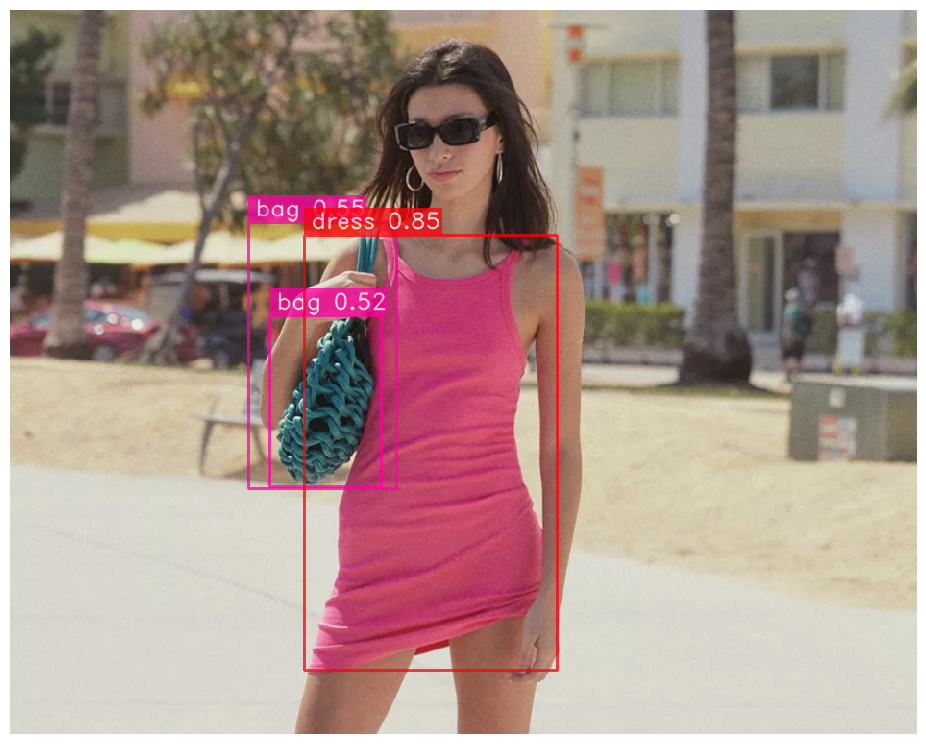

In [ ]:
url = 'https://www.rollingstone.com/wp-content/uploads/2023/06/barbiecore-fashion-trend-barbie-inspired-clothing-apparel-accessories.png'
best_model.predict( url,  conf=0.51).show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[2023-12-07 14:49:55] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/visualization/utils.py:67: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("gist_rainbow", num_classes)


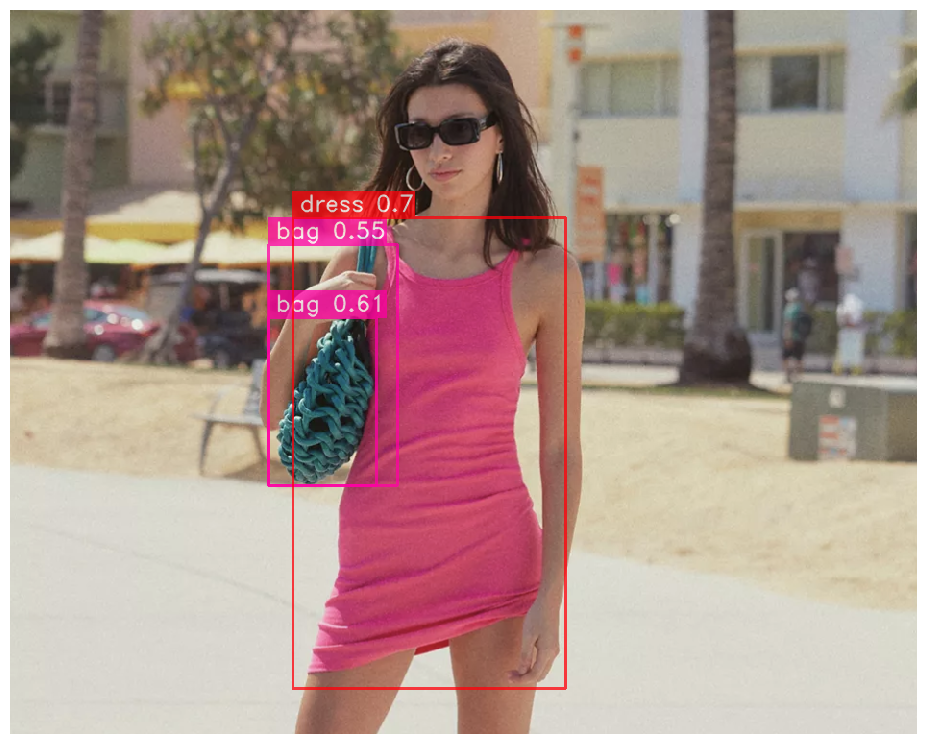

In [ ]:
url = 'https://www.rollingstone.com/wp-content/uploads/2023/06/barbiecore-fashion-trend-barbie-inspired-clothing-apparel-accessories.png'
best_model1.predict( url,  conf=0.51).show()

[2023-12-07 15:03:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


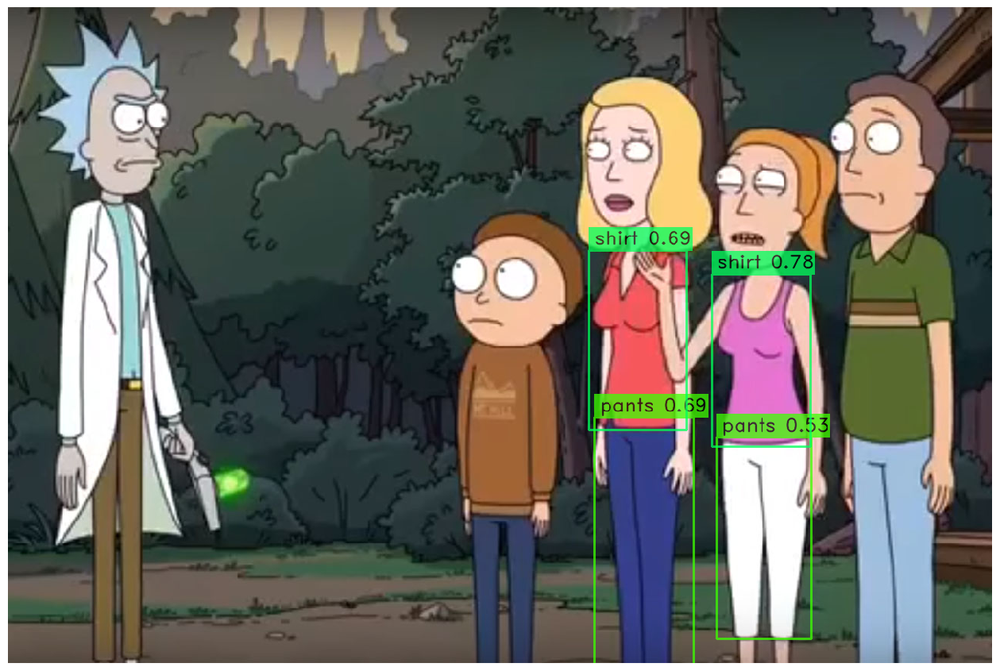

In [ ]:
url = 'https://decider.com/wp-content/uploads/2017/10/rick-and-morty-310-feature.jpg?quality=75&strip=all'
best_model.predict( url,  conf=0.51).show()

# Try YOLOv8

In [ ]:
images_path = 'drive/MyDrive/colorful_fashion_dataset_for_object_detection/JPEGImages/'
annotations_path  = 'drive/MyDrive/colorful_fashion_dataset_for_object_detection/Annotations_txt/'
path = 'drive/MyDrive/colorful_fashion_dataset_for_object_detection/'

In [ ]:
from ultralytics import YOLO

# load pre-trained model
detection_model = YOLO("yolov8m.pt")

100%|██████████| 49.7M/49.7M [00:00<00:00, 431MB/s]


WARNING ⚠️ 'line_thickness' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'line_width' instead.
WARNING ⚠️ 'hide_labels' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'show_labels' instead.

Found https://i.stack.imgur.com/GRdCC.jpg locally at GRdCC.jpg
image 1/1 /content/GRdCC.jpg: 448x640 1 person, 1 bicycle, 5 cars, 1 truck, 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


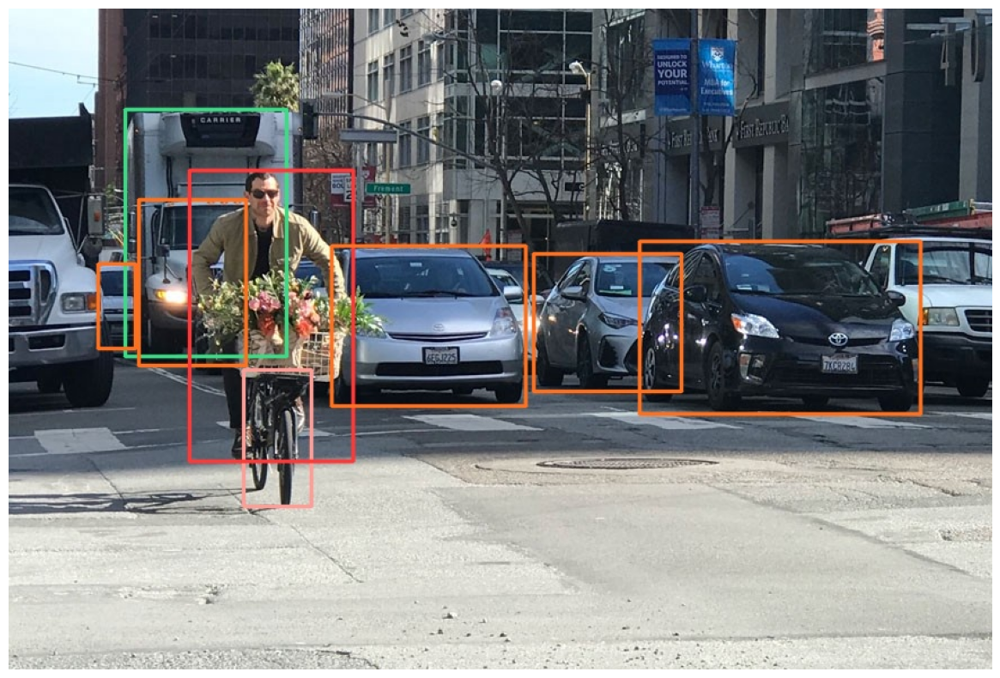

In [ ]:
# choose random image
img = random.choice(os.listdir(images_path))

i=detection_model.predict(source='https://i.stack.imgur.com/GRdCC.jpg', conf=0.5, save=True, line_thickness=2, hide_labels=False)

im = plt.imread('runs/detect/predict/GRdCC.jpg')
plt.figure(figsize=(20,10))
plt.axis('off')
plt.imshow(im)

# Plot Training Data with Annotations

In [ ]:
def convert(size,x,y,w,h):
    box = np.zeros(4)
    dw = 1./size[0]
    dh = 1./size[1]
    x = x/dw
    w = w/dw
    y = y/dh
    h = h/dh
    box[0] = x-(w/2.0)
    box[1] = x+(w/2.0)
    box[2] = y-(h/2.0)
    box[3] = y+(h/2.0)

    return (box)

def plot_annotations(img, filename):
    with open(annotations_path+filename, 'r') as f:
        for line in f:
            value = line.split()
            cls = int(value[0])
            x = float(value[1]) #x coordinate
            y = float(value[2]) #y coordinate
            w = float(value[3]) #width
            h = float(value[4]) #height

            img_h, img_w = img.shape[:2]
            bb = convert((img_w, img_h), x,y,w,h)
            cv2.rectangle(img, (int(round(bb[0])),int(round(bb[2]))),(int(round(bb[1])),int(round(bb[3]))),(255,0,0),2)
            plt.axis('off')
            plt.imshow(img)

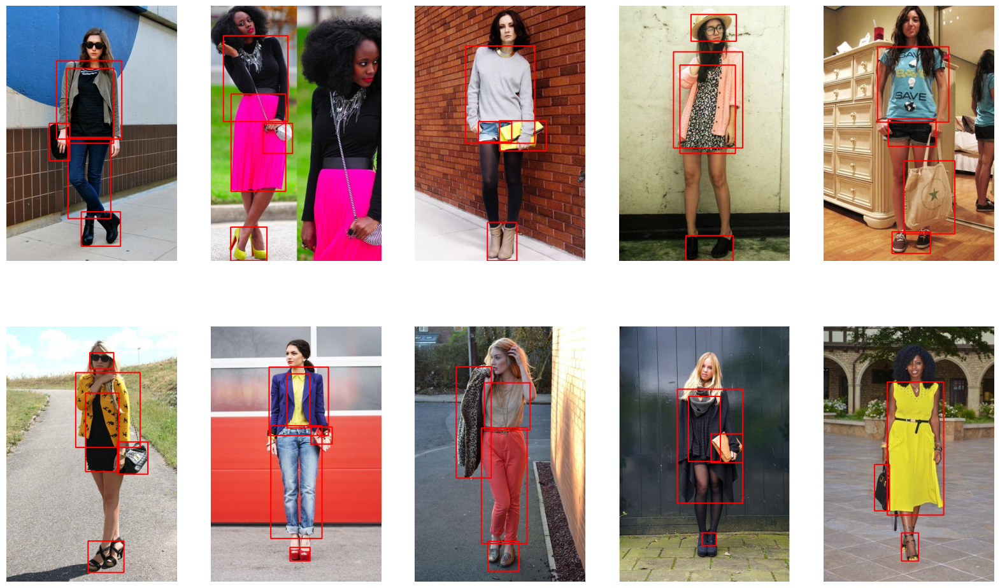

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import cv2
import numpy as np

plt.figure(figsize=(20,12))
ls = os.listdir(images_path)
c = 1
for i in random.sample(ls, 10):
    img = plt.imread(images_path+i)
    i = i.rstrip('.jpg') + '.txt'
    plt.subplot(2,5, c)
    plot_annotations(img, i)
    c+=1

# Prepare Dataset

In [ ]:
train = []
with open(path+'ImageSets/Main/trainval.txt', 'r') as f:
    for line in f.readlines():
        if line[-1]=='\n':
            line = line[:-1]
        train.append(line)

test = []
with open(path+'ImageSets/Main/test.txt', 'r') as f:
    for line in f.readlines():
        if line[-1]=='\n':
            line = line[:-1]
        test.append(line)

In [ ]:
len(train), len(test)

(2145, 537)

In [ ]:
os.mkdir('train')
os.mkdir('train/images')
os.mkdir('train/labels')

os.mkdir('test')
os.mkdir('test/images')
os.mkdir('test/labels')

In [ ]:
train_path = '/kaggle/working/train/'
test_path = '/kaggle/working/test/'

print('Copying Train Data..!!')
for i in tqdm.tqdm(train):
    a = shutil.copyfile(images_path+i+'.jpg', train_path+'images/'+i+'.jpg')
    a = shutil.copyfile(annotations_path+i+'.txt', train_path+'labels/'+i+'.txt')

print('Copying Test Data..!!')
for i in tqdm.tqdm(test):
    a = shutil.copyfile(images_path+i+'.jpg', test_path+'images/'+i+'.jpg')
    a = shutil.copyfile(annotations_path+i+'.txt', test_path+'labels/'+i+'.txt')

Copying Train Data..!!


100%|██████████| 2145/2145 [00:27<00:00, 79.43it/s]


Copying Test Data..!!


100%|██████████| 537/537 [00:07<00:00, 75.79it/s]


# Train Custom Model

In [ ]:
text = """
train: /kaggle/working/train
val: /kaggle/working/test

# number of classes
nc: 10

# class names
names: ['sunglass','hat','jacket','shirt','pants','shorts','skirt','dress','bag','shoe']
"""
with open("data.yaml", 'w') as file:
    file.write(text)

In [ ]:
model = YOLO("yolov8m.pt")

model.train(data='data.yaml', epochs=5)

Ultralytics YOLOv8.0.58 🚀 Python-3.7.12 torch-1.13.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=data.yaml, epochs=5, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify=

  0%|          | 0.00/755k [00:00<?, ?B/s]

Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.Conv                  [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.Conv                  [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.C2f                   [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.Conv                  [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.C2f                   [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.Conv                  [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.C2f                   [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytic

  0%|          | 0.00/6.23M [00:00<?, ?B/s]

AMP: checks passed ✅
optimizer: SGD(lr=0.01) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias
train: Scanning /kaggle/working/train/labels... 2145 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2145/2145 [00:01<00:00, 2095.27it/s]
train: New cache created: /kaggle/working/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
val: Scanning /kaggle/working/test/labels... 537 images, 0 backgrounds, 0 corrupt: 100%|██████████| 537/537 [00:00<00:00, 2082.32it/s]
val: New cache created: /kaggle/working/test/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
        1/5      7.51G      1.351      2.144      1.517      

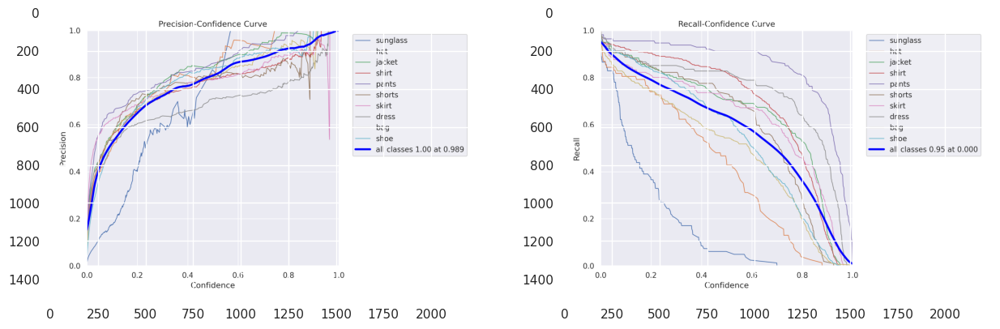

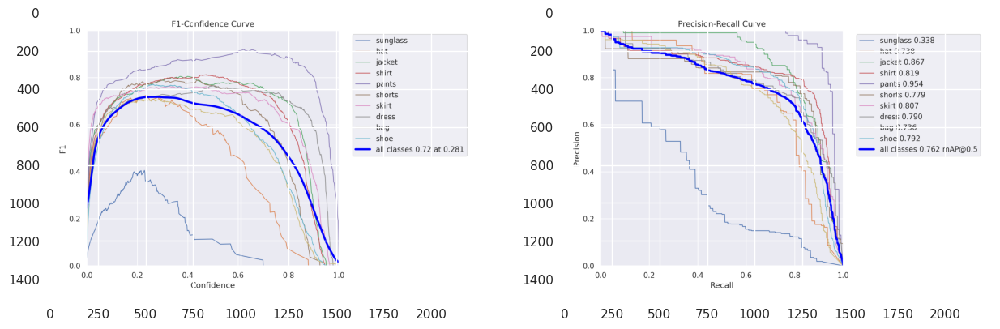

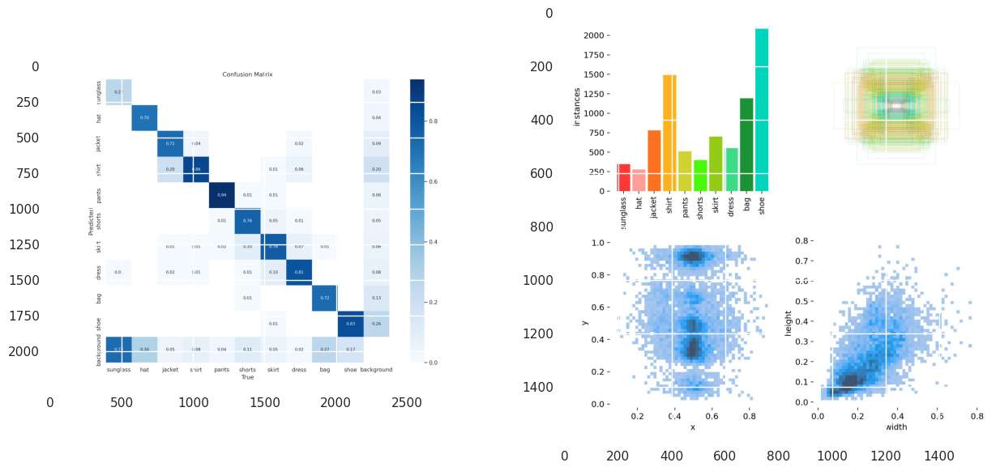

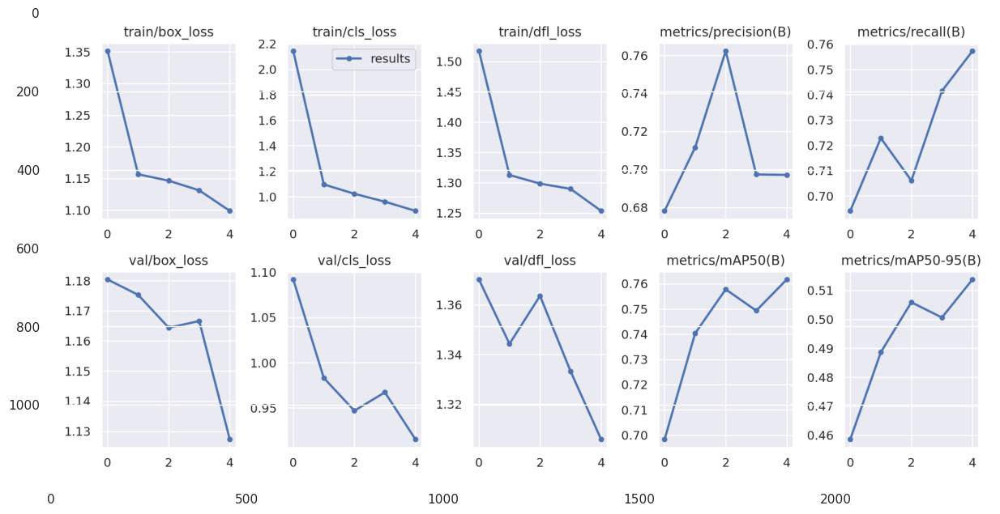

In [ ]:
%matplotlib inline
model_path = 'runs/detect/train/'

def plot(ls, size):
    c=1
    plt.figure(figsize=(15,10))
    for im in ls:
        plt.subplot(size[0],size[1],c)
        im = plt.imread(model_path+im)
        plt.imshow(im)
        c+=1
    plt.show()

plot(['P_curve.png','R_curve.png'], (1,2))
plot(['F1_curve.png','PR_curve.png'], (1,2))
plot(['confusion_matrix.png','labels.jpg'], (1,2))
plot(['results.png'],(1,1))

# Test Model


image 1/1 /kaggle/input/colorful-fashion-dataset-for-object-detection/colorful_fashion_dataset_for_object_detection/JPEGImages/133549.jpg: 640x448 1 hat, 1 shirt, 1 skirt, 1 shoe, 21.7ms
Speed: 0.5ms preprocess, 21.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2

image 1/1 /kaggle/input/colorful-fashion-dataset-for-object-detection/colorful_fashion_dataset_for_object_detection/JPEGImages/17856.jpg: 640x448 1 jacket, 1 shirt, 1 pants, 21.3ms
Speed: 0.5ms preprocess, 21.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2

image 1/1 /kaggle/input/colorful-fashion-dataset-for-object-detection/colorful_fashion_dataset_for_object_detection/JPEGImages/62639.jpg: 640x448 1 shirt, 1 pants, 1 bag, 21.1ms
Speed: 0.4ms preprocess, 21.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2

image 1/1 /kaggle/input/colorful-fashion-data

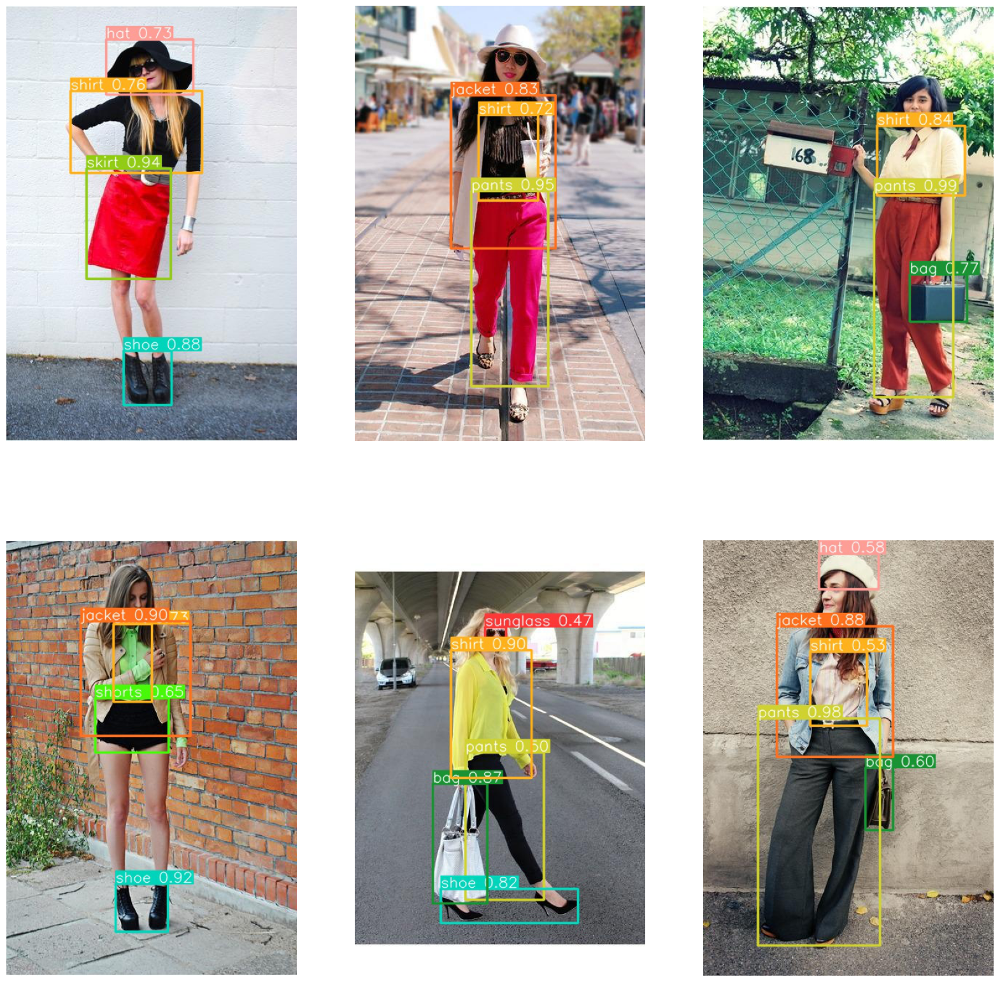

In [ ]:
# choose random image from dataset
plt.figure(figsize=(20,20))
imgs = random.sample(os.listdir(images_path), 6)
c=1
for img in imgs:
    i=model.predict(source=images_path+img, conf=0.4, save=True, line_thickness=2)

    im = plt.imread('/kaggle/working/runs/detect/predict2/'+img)
    plt.subplot(2,3,c)
    plt.axis('off')
    plt.imshow(im)
    c+=1